In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
#importing libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.express as px # to plot the time series plot
from sklearn import metrics # for the evaluation
from sklearn.preprocessing import LabelEncoder,MinMaxScaler
import tensorflow as tf


In [ ]:
data = pd.read_csv('/content/drive/MyDrive/Pix_and_power.csv')#[:-1]
 #data.plot(color='red')

In [ ]:
for i in data.select_dtypes('object').columns:
   le = LabelEncoder().fit(data[i])
   data[i] = le.transform(data[i])
data

,time,power,pix,pix_240,pix_220,pix_180,pix_150,Unnamed: 7
0,1081,0.0,0,0,0,0,0,NaN
1,1082,0.0,0,0,0,0,0,NaN
2,1083,0.0,0,0,0,0,0,NaN
3,1084,0.0,0,0,0,0,0,NaN
4,1085,0.0,0,0,0,0,0,NaN
...,...,...,...,...,...,...,...,...
10915,1076,0.0,0,0,0,0,0,NaN
10916,1077,0.0,0,0,0,0,0,NaN
10917,1078,0.0,0,0,0,0,0,NaN
10918,1079,0.0,0,0,0,0,0,NaN


Index(['time', 'power', 'pix', 'pix_240', 'pix_220', 'pix_180', 'pix_150',
       'Unnamed: 7'],
      dtype='object')
10920


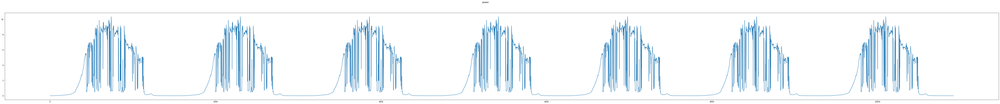

In [ ]:
data.columns
print(data.columns)
all_data = data['power'].values.astype(float)
print(len(all_data))

#training_set = training_set.iloc[:,1:2].values
plt.figure(figsize=(100,9))
plt.plot(all_data)

#plt.plot(power, label = 'AVG power2')
plt.suptitle('power')
plt.show()


Index(['time', 'power', 'pix', 'pix_240', 'pix_220', 'pix_180', 'pix_150',
       'Unnamed: 7'],
      dtype='object')
10920


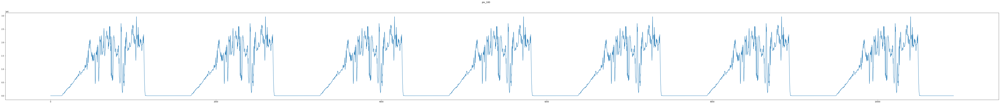

In [ ]:
data.columns
print(data.columns)
pix_data = data['pix_180'].values.astype(float)

print(len(all_data))
plt.figure(figsize=(100,9))

plt.plot(pix_data)

plt.suptitle('pix_180')
plt.show()


Index(['time', 'power', 'pix', 'pix_240', 'pix_220', 'pix_180', 'pix_150',
       'Unnamed: 7'],
      dtype='object')
10920


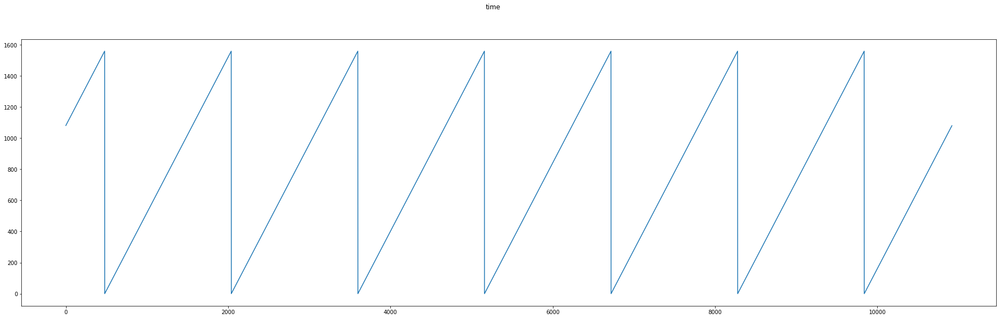

In [ ]:
data.columns
print(data.columns)
pix_data = data['time'].values.astype(float)

print(len(all_data))
plt.figure(figsize=(32,9))


plt.plot(pix_data)

plt.suptitle('time')
plt.show()

In [ ]:
X_scaler = MinMaxScaler()
Y_scaler = MinMaxScaler()
X_data = X_scaler.fit_transform(data[['pix_180']])
X_data1 = X_scaler.fit_transform(data[['power']])
Y_data = Y_scaler.fit_transform(data[['power']]) #np.array(data[['power']])#
X_data
Y_data

array([[0.],
       [0.],
       [0.],
       ...,
       [0.],
       [0.],
       [0.]])

In [ ]:
def custom_ts_multi_data_prep(dataset, target, start, end, window, horizon):
    X = []
    y = []
    start = start + window
    if end is None:
       end = len(dataset) - horizon
    for i in range(start, end):
       indices = range(i-window, i)
       X.append(dataset[indices])
       #print(X)
       indicey = range(i+1, i+1+horizon)
       y.append(target[indicey][-1])
    return np.array(X), np.array(y)

In [ ]:
hist_window = 80
horizon = 20
TRAIN_SPLIT = int(len(X_data)*0.7)

x_train, y_train = custom_ts_multi_data_prep(X_data, Y_data, 0, TRAIN_SPLIT, hist_window, horizon)
x_vali, y_vali = custom_ts_multi_data_prep(X_data, Y_data, TRAIN_SPLIT, None, hist_window, horizon)

x_train1, y_train1 = custom_ts_multi_data_prep(X_data1, Y_data, 0, TRAIN_SPLIT, hist_window, horizon)
x_vali1, y_vali1 = custom_ts_multi_data_prep(X_data1, Y_data, TRAIN_SPLIT, None, hist_window, horizon)
print(len(x_train),len(x_train1))
#len(Y_data)

7563 7563


In [ ]:
#print ('Multiple window of past history\n')
#print(x_train[0])
#print ('\n Target horizon\n')
#print (y_train[0])

In [ ]:
batch_size = 64
buffer_size = 10
train_data = tf.data.Dataset.from_tensor_slices((x_train, y_train))
train_data = train_data.cache().shuffle(buffer_size).batch(batch_size).repeat()
val_data = tf.data.Dataset.from_tensor_slices((x_vali, y_vali))
val_data = val_data.batch(batch_size).repeat()

train_data1 = tf.data.Dataset.from_tensor_slices((x_train1, y_train1))
train_data1 = train_data1.cache().shuffle(buffer_size).batch(batch_size).repeat()
val_data1 = tf.data.Dataset.from_tensor_slices((x_vali1, y_vali1))
val_data1 = val_data1.batch(batch_size).repeat()
val_data
x_train.shape[-2:]


(80, 1)

In [ ]:
lstm_model = tf.keras.models.Sequential([
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences=True),input_shape=x_train.shape[-2:]),
  #tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences= True)),
  # # #tf.keras.layers.Dropout(0.2),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(64, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= False)),
  #tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dense(8, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(4, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(4, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  #tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1),
 ])
lstm_model.compile(optimizer='adam', loss='mse')
lstm_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional (Bidirectiona  (None, 80, 64)           8704      
 l)                                                              
                                                                 
 bidirectional_1 (Bidirectio  (None, 80, 64)           24832     
 nal)                                                            
                                                                 
 bidirectional_2 (Bidirectio  (None, 80, 32)           10368     
 nal)                                                            
                                                                 
 bidirectional_3 (Bidirectio  (None, 80, 32)           6272      
 nal)                                                            
                                                                 
 bidirectional_4 (Bidirectio  (None, 80, 16)           2

In [ ]:
model_path = '/content/drive/MyDrive/SkyImageModel_180.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint]

In [ ]:
history = lstm_model.fit(train_data,epochs=75,steps_per_epoch=100,validation_data=val_data,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/75
100/100 [==============================] - 59s 375ms/step - loss: 0.1050 - val_loss: 0.0526
Epoch 2/75
100/100 [==============================] - 33s 334ms/step - loss: 0.0807 - val_loss: 0.0507
Epoch 3/75
100/100 [==============================] - 32s 321ms/step - loss: 0.0822 - val_loss: 0.0528
Epoch 4/75
100/100 [==============================] - 33s 326ms/step - loss: 0.0732 - val_loss: 0.0503
Epoch 5/75
100/100 [==============================] - 33s 327ms/step - loss: 0.0673 - val_loss: 0.0467
Epoch 6/75
100/100 [==============================] - 34s 343ms/step - loss: 0.0639 - val_loss: 0.0457
Epoch 7/75
100/100 [==============================] - 33s 327ms/step - loss: 0.0649 - val_loss: 0.0450
Epoch 8/75
100/100 [==============================] - 32s 324ms/step - loss: 0.0707 - val_loss: 0.0463
Epoch 9/75
100/100 [==============================] - 33s 326ms/step - loss: 0.0633 - val_loss: 0.0440
Epoch 10/75
100/100 [==============================] - 32s 322ms/step - l

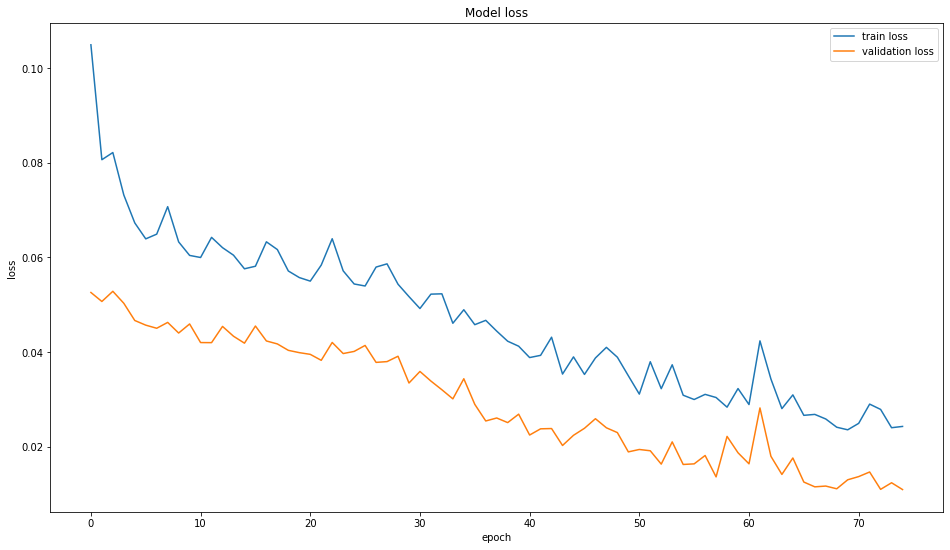

In [ ]:


plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show()

In [ ]:
# num = int(len(data[[ 'pix']])/7)

In [ ]:
# data_val = X_scaler.fit_transform(data[[ 'pix']])[:num]
# Expected = X_scaler.fit_transform(data[['power' ]])[:num]
# print(len(Expected))
# print(len(data_val))

In [ ]:
# data_for_pred, Expected_val = custom_ts_multi_data_prep(data_val, Expected, 0, None, hist_window, horizon)

In [ ]:
# pred = []
# print(len(data_for_pred))

# for i in data_for_pred:
#   #print(len(i))
#   #print(i.shpae)
#   i = i.reshape(1, i.shape[0], i.shape[1])
#   pred.append(lstm_model.predict(i))
#   #break
# #pred = np.array(pred)
# pred[0][0]

In [ ]:
# act_pred =[]
# for preds in pred:
#   #print(preds)

#   pred_Inverse = Y_scaler.inverse_transform(preds)
#   act_pred.append(pred_Inverse)
# len(act_pred)
# #act_pred

In [ ]:
# predn = []
# for item in list(act_pred):
#   item = float(item[0])
#   item = round(item, 2)
#   predn.append(item)
#   #print(item)
# #pred

In [ ]:
# Expected = Y_scaler.inverse_transform(Expected)
# Expected
# Expected_list = []
# for item in list(Expected):
#   Expected_list.append(float(item[0]))
#   #print(item)
# len(Expected)

In [ ]:
# plt.figure(figsize=(50,12))
# #
# plt.plot( list(Expected[len(Expected)-len(predn):]))
# plt.plot(predn)
# # plt.plot(pred1)
# plt.title("Actual vs Predicted_image")
# plt.ylabel("Generation")
# plt.legend(('Actual','predicted_image'))
# plt.show()

In [ ]:
lstm_model1 = tf.keras.models.Sequential([
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences=True),input_shape=x_train.shape[-2:]),
  #tf.keras.layers.Dropout(0.2),
  #  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences= True)),
  # #tf.keras.layers.Dropout(0.2),
  # # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences= True)),
  # # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(128, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(32, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(16, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= True)),
  # tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= True)),
  tf.keras.layers.Bidirectional(tf.keras.layers.LSTM(8, return_sequences= False)),
  #tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dense(8, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(4, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  #tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dense(2, activation='tanh'),
  tf.keras.layers.Dropout(0.2),
  tf.keras.layers.Dense(1),
 ])
lstm_model1.compile(optimizer='adam', loss='mse')
lstm_model1.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_6 (Bidirectio  (None, 80, 64)           8704      
 nal)                                                            
                                                                 
 bidirectional_7 (Bidirectio  (None, 80, 32)           10368     
 nal)                                                            
                                                                 
 bidirectional_8 (Bidirectio  (None, 16)               2624      
 nal)                                                            
                                                                 
 dense_5 (Dense)             (None, 8)                 136       
                                                                 
 dropout_4 (Dropout)         (None, 8)                 0         
                                                      

In [ ]:
model_path = '/content/drive/MyDrive/StatisticsModel_180.h5'
early_stopings = tf.keras.callbacks.EarlyStopping(monitor='val_loss', min_delta=0, patience=10, verbose=1, mode='min')
checkpoint =  tf.keras.callbacks.ModelCheckpoint(model_path, monitor='val_loss', save_best_only=True, mode='min', verbose=0)
callbacks=[early_stopings,checkpoint]

In [ ]:
history = lstm_model1.fit(train_data1,epochs=50,steps_per_epoch=100,validation_data=val_data1,validation_steps=50,verbose=1,callbacks=callbacks)

Epoch 1/50
100/100 [==============================] - 30s 185ms/step - loss: 0.0970 - val_loss: 0.0581
Epoch 2/50
100/100 [==============================] - 16s 161ms/step - loss: 0.0750 - val_loss: 0.0505
Epoch 3/50
100/100 [==============================] - 16s 161ms/step - loss: 0.0767 - val_loss: 0.0432
Epoch 4/50
100/100 [==============================] - 16s 156ms/step - loss: 0.0656 - val_loss: 0.0455
Epoch 5/50
100/100 [==============================] - 16s 157ms/step - loss: 0.0615 - val_loss: 0.0443
Epoch 6/50
100/100 [==============================] - 16s 158ms/step - loss: 0.0597 - val_loss: 0.0448
Epoch 7/50
100/100 [==============================] - 16s 160ms/step - loss: 0.0600 - val_loss: 0.0457
Epoch 8/50
100/100 [==============================] - 16s 157ms/step - loss: 0.0655 - val_loss: 0.0440
Epoch 9/50
100/100 [==============================] - 16s 158ms/step - loss: 0.0589 - val_loss: 0.0444
Epoch 10/50
100/100 [==============================] - 16s 161ms/step - l

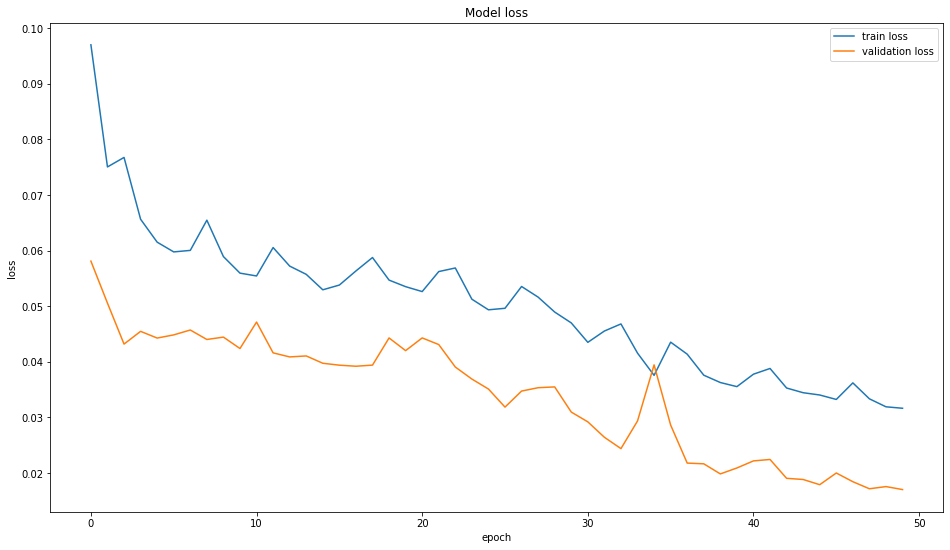

In [ ]:
plt.figure(figsize=(16,9))
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train loss', 'validation loss'])
plt.show()

In [ ]:
# num = int(len(data[[ 'pix']])*0.1)
num = int(len(data[[ 'pix']])/7)

In [ ]:
data_val = X_scaler.fit_transform(data[[ 'pix_180']])[:num]
Expected = X_scaler.fit_transform(data[['power' ]])[:num]
print(len(Expected))
print(len(data_val))

1560
1560


In [ ]:
data_val1 = X_scaler.fit_transform(data[[ 'power']])[:num]
Expected1 = X_scaler.fit_transform(data[['power' ]])[:num]
print(len(Expected1))
print(len(data_val1))

1560
1560


In [ ]:
data_for_pred, Expected_val = custom_ts_multi_data_prep(data_val, Expected, 0, None, hist_window, horizon)
data_for_pred1, Expected_val1 = custom_ts_multi_data_prep(data_val1, Expected1, 0, None, hist_window, horizon)
#data_for_pred[0], Expected_val[0]

In [ ]:
# len(data_for_pred)

In [ ]:
pred = []
print(len(data_for_pred))

for i in data_for_pred:
  #print(len(i))
  #print(i.shpae)
  i = i.reshape(1, i.shape[0], i.shape[1])
  pred.append(lstm_model.predict(i))
  #break
#pred = np.array(pred)
pred[0][0]

1460


array([0.03114682], dtype=float32)

In [ ]:
pred1 = []
print(len(data_for_pred1))

for i in data_for_pred1:
  #print(len(i))
  #print(i.shpae)
  i = i.reshape(1, i.shape[0], i.shape[1])
  pred1.append(lstm_model1.predict(i))
  #break
#pred = np.array(pred)
pred1[0][0]

1460


array([0.04214117], dtype=float32)

In [ ]:
#pred

In [ ]:
act_pred =[]
for preds in pred:
  #print(preds)

  pred_Inverse = Y_scaler.inverse_transform(preds)
  act_pred.append(pred_Inverse)
len(act_pred)
#act_pred

1460

In [ ]:
act_pred1 =[]
for preds in pred1:
  #print(preds)

  pred_Inverse = Y_scaler.inverse_transform(preds)
  act_pred1.append(pred_Inverse)
len(act_pred1)

1460

In [ ]:
predn = []
for item in list(act_pred):
  item = float(item[0])
  item = round(item, 2)
  predn.append(item)
  #print(item)
#pred

In [ ]:
predn1 = []
for item in list(act_pred1):
  item = float(item[0])
  item = round(item, 2)
  predn1.append(item)
  #print(item)
#pred

In [ ]:
len(Expected), len(pred)

(1560, 1460)

In [ ]:
Expected = Y_scaler.inverse_transform(Expected)
Expected
Expected_list = []
for item in list(Expected):
  Expected_list.append(float(item[0]))
  #print(item)
len(Expected)

1560

In [ ]:
Expected1 = Expected[len(Expected)-len(predn):]

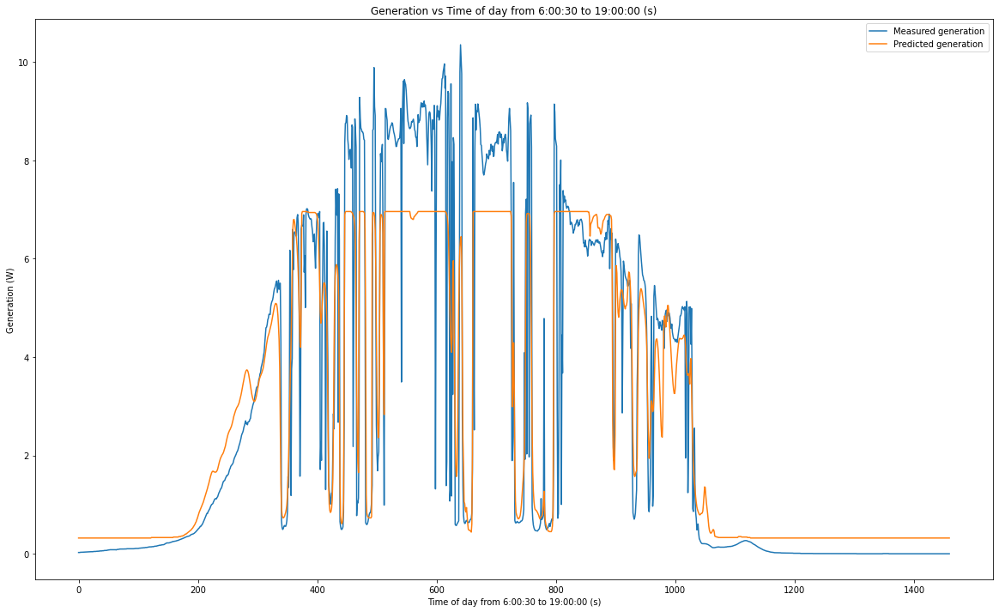

In [ ]:
plt.figure(figsize=(20,12))
#
plt.plot( list(Expected1))
plt.plot(predn)
# plt.plot(pred1)
plt.title("Generation vs Time of day from 6:00:30 to 19:00:00 (s)")
plt.ylabel("Generation (W)")
plt.xlabel("Time of day from 6:00:30 to 19:00:00 (s)")
plt.legend(('Measured generation','Predicted generation'))
plt.show()

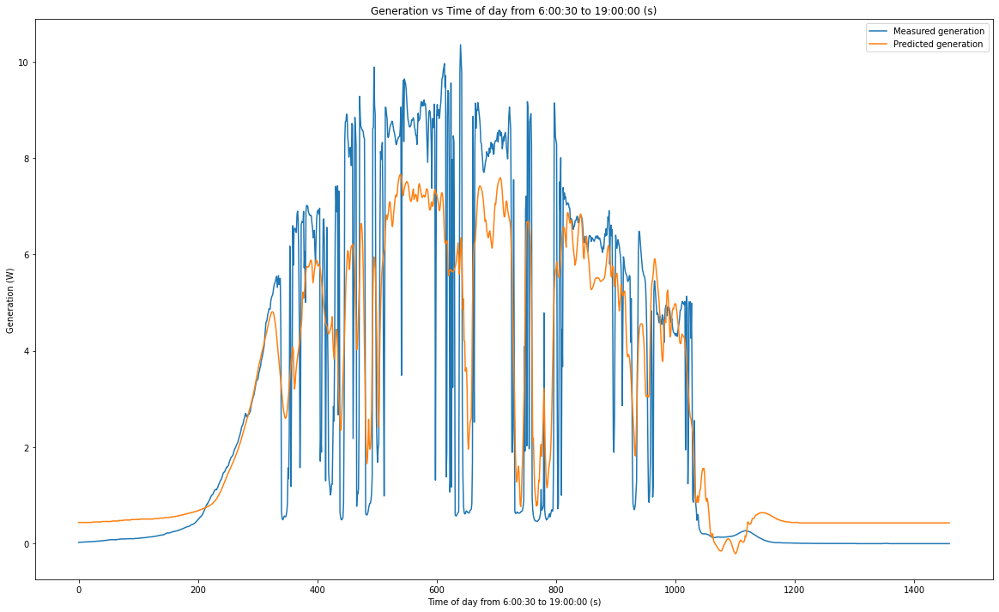

In [ ]:
plt.figure(figsize=(20,12))
#
plt.plot( list(Expected1))
plt.plot(predn1)
#plt.plot(pred1)
plt.title("Generation vs Time of day from 6:00:30 to 19:00:00 (s)")
plt.ylabel("Generation (W)")
plt.xlabel("Time of day from 6:00:30 to 19:00:00 (s)")
plt.legend(('Measured generation','Predicted generation'))
plt.show()

In [ ]:
rmse = []
for i in range(len(Expected1)):
  per_err = (Expected1[i][0] - predn[i])**2
  # print(per_err)
  rmse.append(per_err)
rmse = list(rmse)
rmse = (sum(rmse)/len(rmse))**0.5
print('rmse value sky imagery model',rmse)

rmse value sky imagery model 1.1253050634054882


In [ ]:
rmse = []
for i in range(len(predn1)):
  per_err = (Expected1[i][0] - predn1[i])**2
  rmse.append(per_err)
rmse = list(rmse)
rmse = (sum(rmse)/len(rmse))**0.5
print('rmse value statistical model',rmse)

rmse value statistical model 1.4025324173139346


In [ ]:
mape = []
count = 0
for i in range(len(pred1)):
  if (Expected[i][0] > pred1[i]):
    count+=1
  per_err = (Expected[i][0] - pred1[i]) / pred1[i]
  per_err = abs(per_err)
  #print(Expected[i][0],pred[i],Expected[i][0]-pred[i], per_err)
  mape.append(per_err)
mape = list(mape)
mape = sum(mape)/len(mape)
mape

array([[116.91808]], dtype=float32)

In [ ]:
def rmse1(pred, expected):
  rmse = []

  for i in range(len(pred)):
    per_err = (Expected1[i][0] - pred[i])**2
    rmse.append(per_err)
  rmse = list(rmse)
  rmse = (sum(rmse)/len(rmse))**0.5
  return rmse

In [ ]:
predn1[0]*0.9

0.396

In [ ]:
ensemble = []
for i in range(len(pred)):
  ensemble.append((predn[i]*0.9+predn1[i]*0.1))
print(ensemble)
rmse1(ensemble,Expected1)


[0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.332, 0.333, 0.333, 0.333, 0.333, 0.333, 0.333, 0.333, 0.333, 0.333, 0.333, 0.333, 0.333, 0.333, 0.333, 0.333, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.334, 0.335, 0.335, 0.335, 0.335, 0.335, 0.335, 0.335, 0.335, 0.335, 0.335, 0.335, 0.336, 0.336, 0.336, 0.336, 0.336, 0.336, 0.336, 0.336, 0.336, 0.337, 0.337, 0.337, 0.337, 0.337, 0.337, 0.337, 0.337, 0.337, 0.337, 0.337, 0.337, 0.338, 0.338, 0.338, 0.338, 0.338, 0.338, 0.338, 0.338, 0.338, 0.338, 0.338, 0.338, 0.338, 0.338, 0.338, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.339, 0.34800000000000003, 0.34800000000000003, 0.34800000000000003, 0.34800000000000003, 0.34800000000000003, 0.34900000000000003, 0.34900000000000003

1.1233882029958007

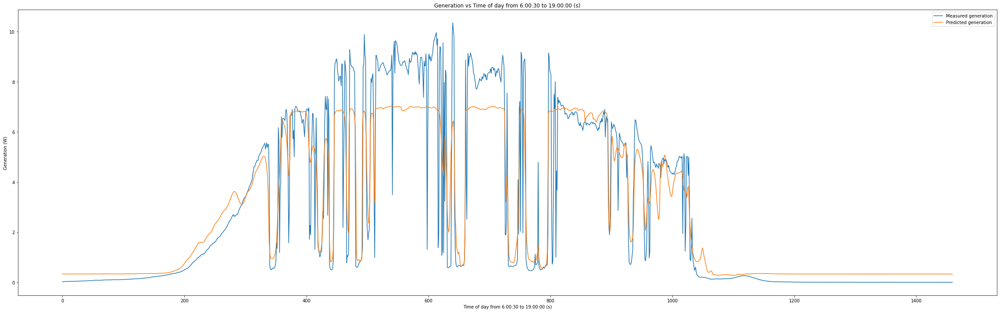

In [ ]:
plt.figure(figsize=(40,12))
#
plt.plot( list(Expected1))
plt.plot(ensemble)
#plt.plot(pred1)
plt.title("Generation vs Time of day from 6:00:30 to 19:00:00 (s)")
plt.ylabel("Generation (W)")
plt.xlabel("Time of day from 6:00:30 to 19:00:00 (s)")
plt.legend(('Measured generation','Predicted generation'))
plt.show()
print(RMSE[count], weights_list[count]/100)
plt.show()

In [ ]:
weights_list = list(range(0,100,1))
print(weights_list)

[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 97, 98, 99]


In [ ]:

ensemble = []
RMSE = []
for weight in weights_list:
  weight = weight/100
  ensemble_new=[]
  for i in range(len(pred)):
    ensemble_new.append((predn[i]*(1-weight)+predn1[i]*weight))


  RMSE.append(rmse1(ensemble_new,Expected1))
  ensemble.append(ensemble_new)

In [ ]:
ensemble[0]


[0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.32,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,
 0.33,

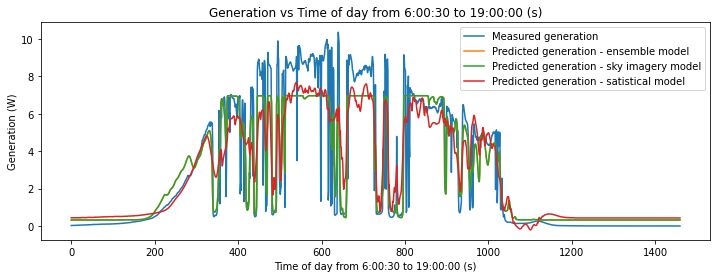

1.1253050634054882 0.0


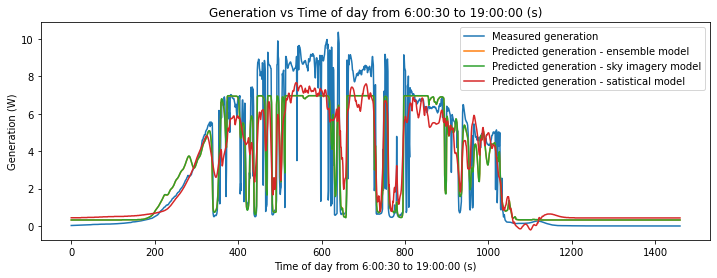

1.1247828913215172 0.01


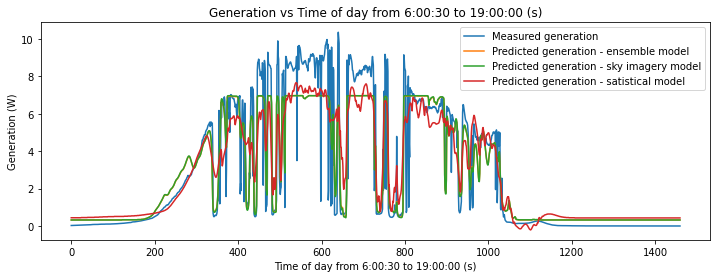

1.1243339932527028 0.02


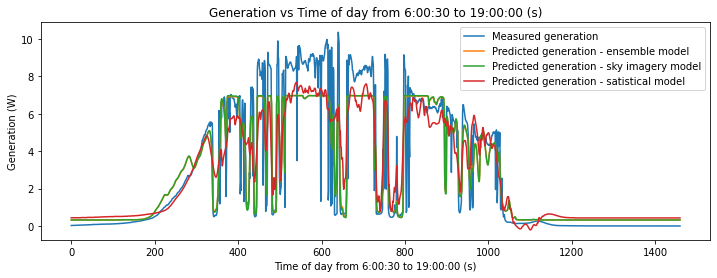

1.1239584569938277 0.03


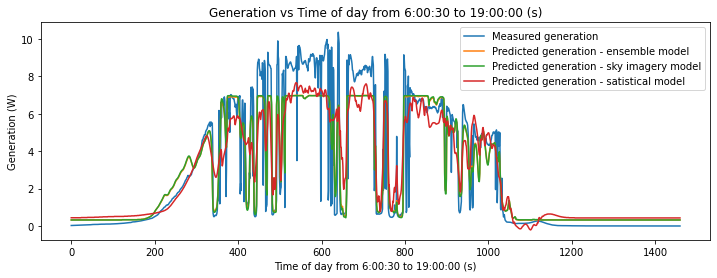

1.123656356099471 0.04


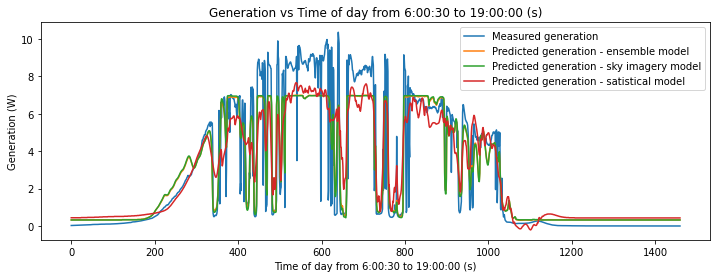

1.123427749812126 0.05


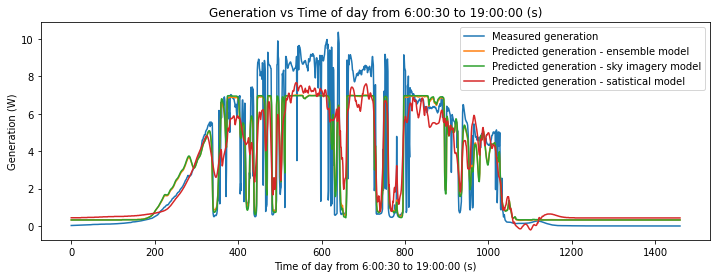

1.123272683004249 0.06


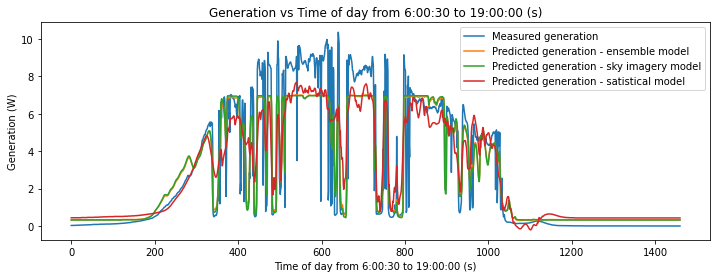

1.1231911861342132 0.07


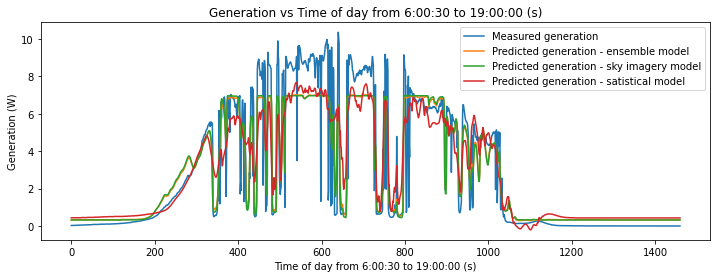

1.1231832752164819 0.08


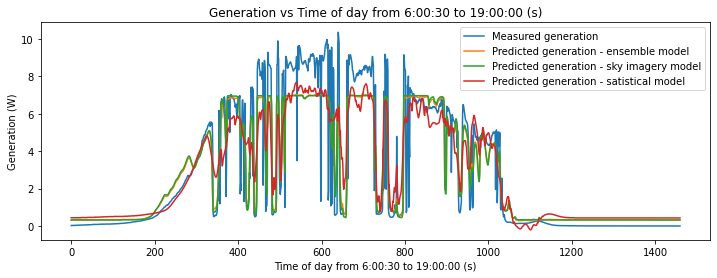

1.1232489518058235 0.09


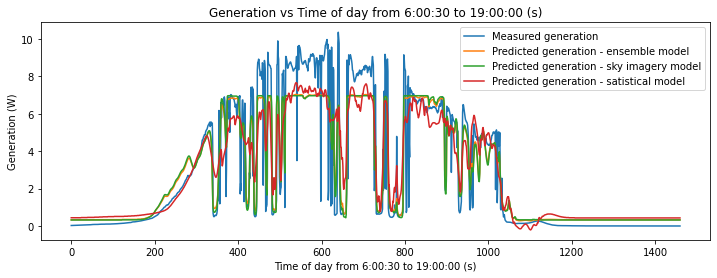

1.1233882029958007 0.1


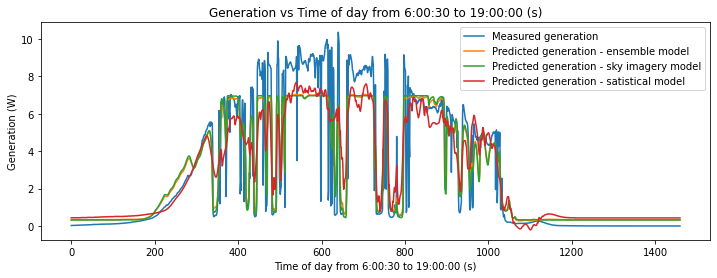

1.1236010014314737 0.11


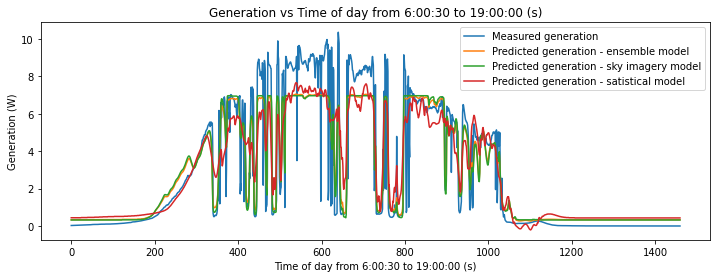

1.123887305336211 0.12


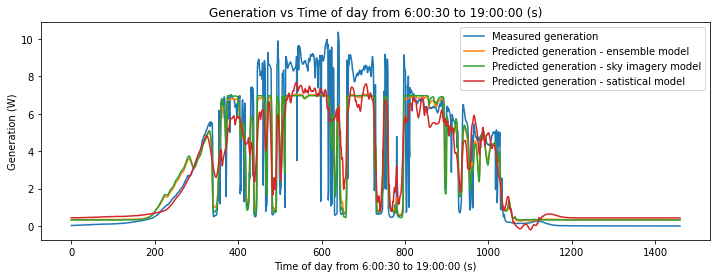

1.124247058552698 0.13


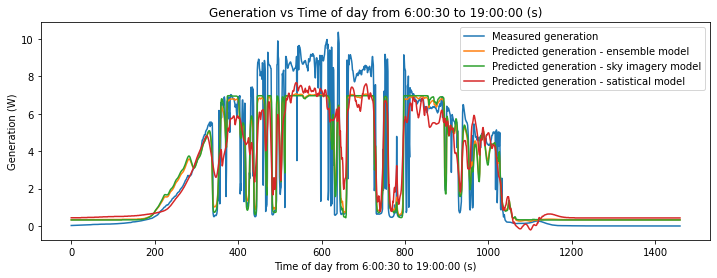

1.124680190597883 0.14


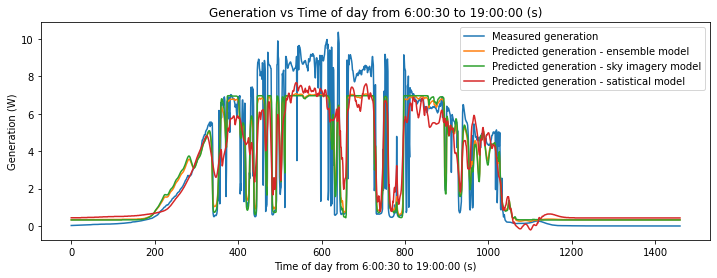

1.125186616731911 0.15


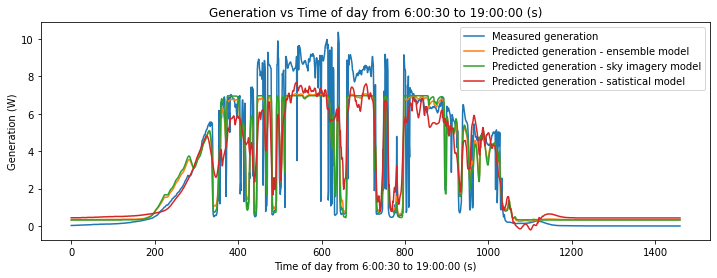

1.1257662380407023 0.16


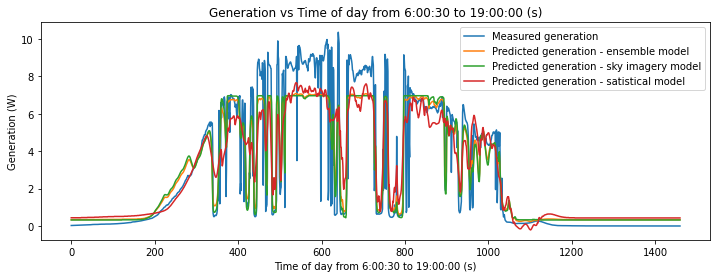

1.1264189415321704 0.17


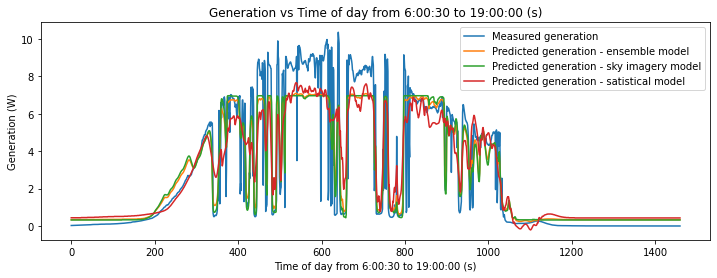

1.1271446002456882 0.18


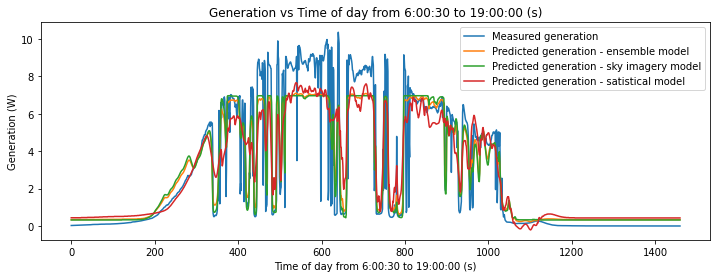

1.1279430733747002 0.19


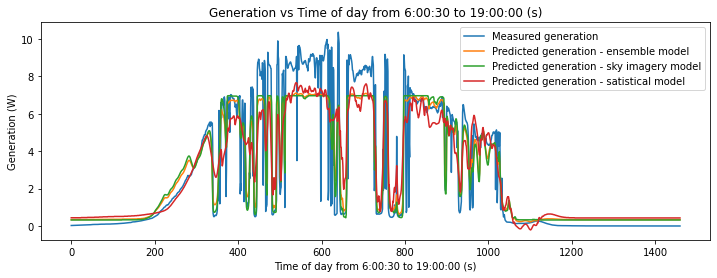

1.1288142064021685 0.2


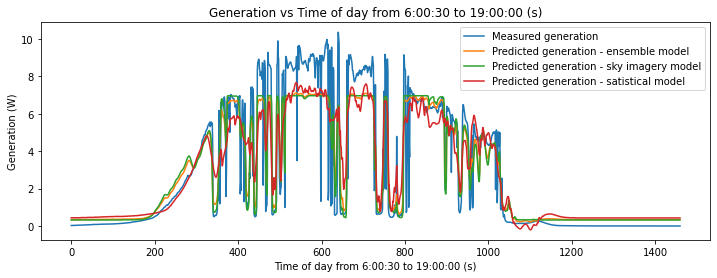

1.129757831248418 0.21


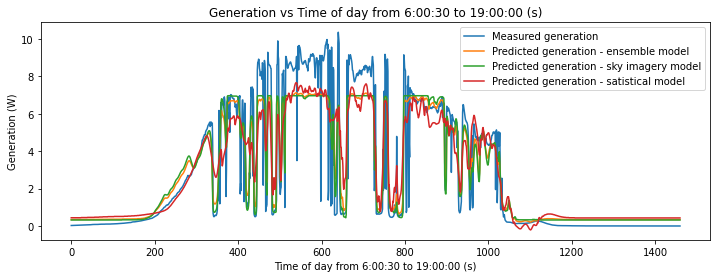

1.1307737664313413 0.22


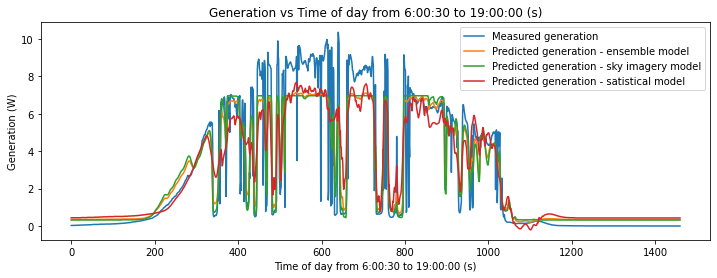

1.131861817238268 0.23


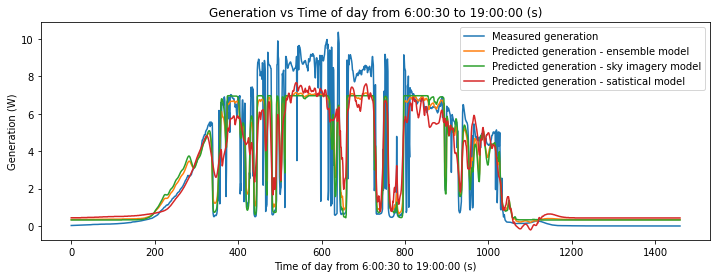

1.1330217759094199 0.24


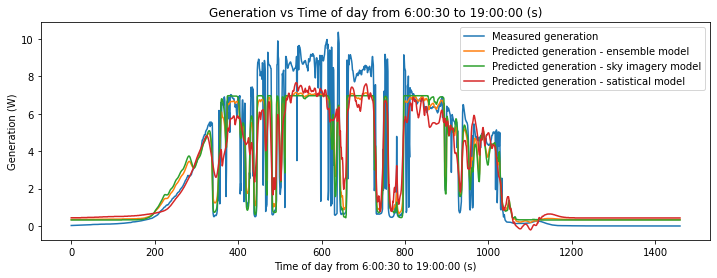

1.1342534218323403 0.25


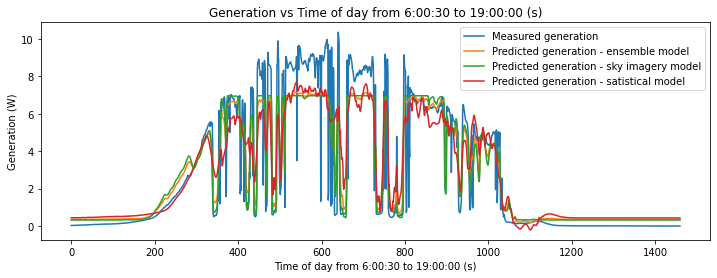

1.1355565217470283 0.26


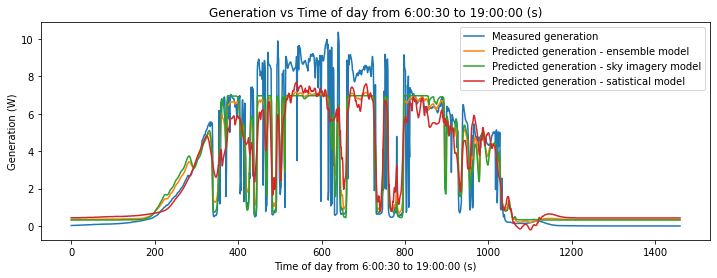

1.1369308299612773 0.27


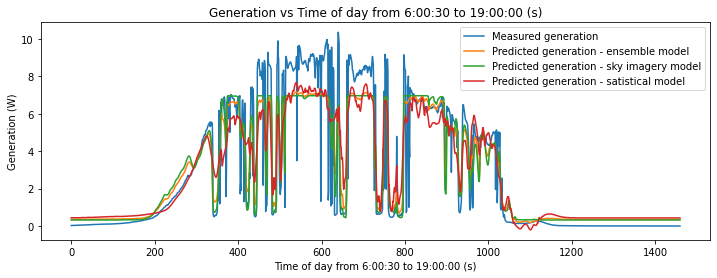

1.1383760885757803 0.28


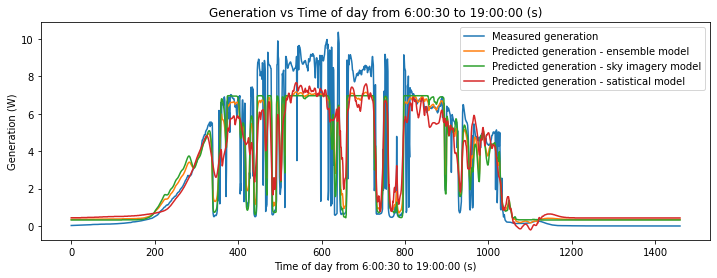

1.1398920277184872 0.29


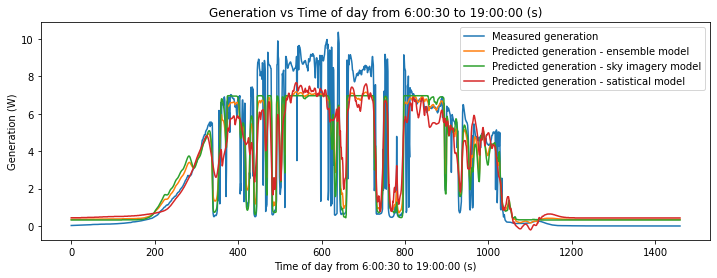

1.1414783657878231 0.3


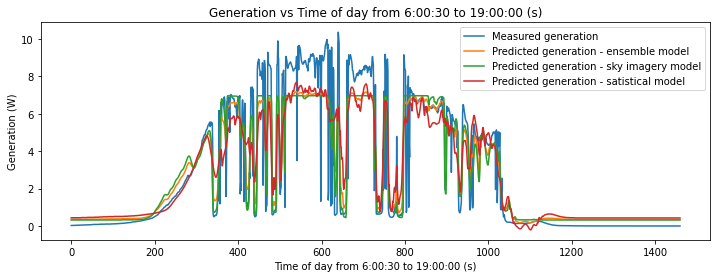

1.1431348097042302 0.31


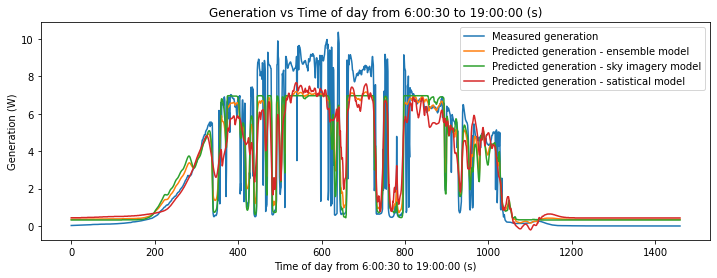

1.1448610551695055 0.32


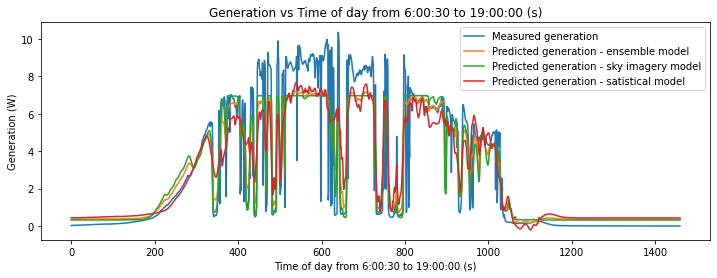

1.1466567869334496 0.33


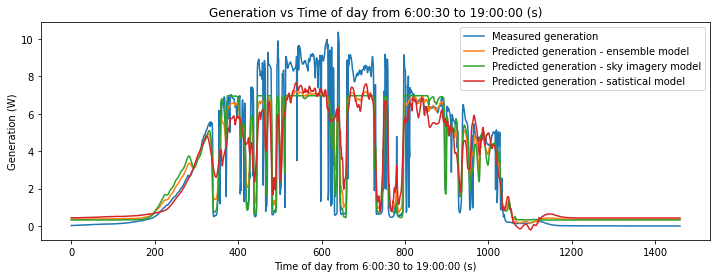

1.148521679067345 0.34


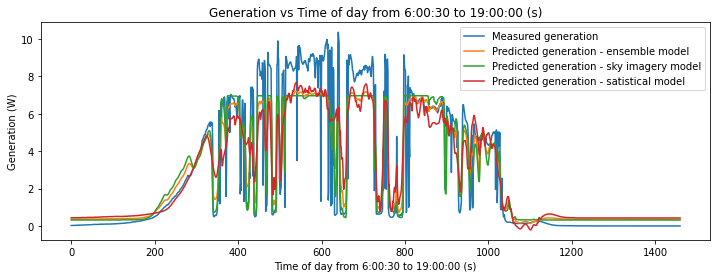

1.1504553952436445 0.35


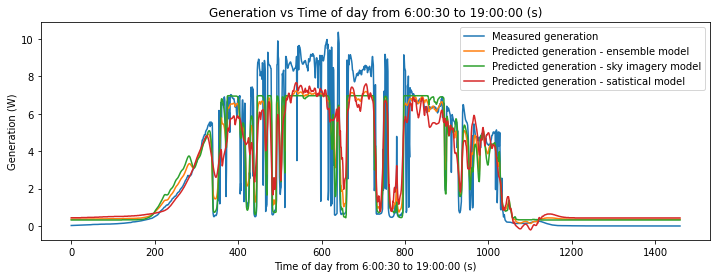

1.1524575890214517 0.36


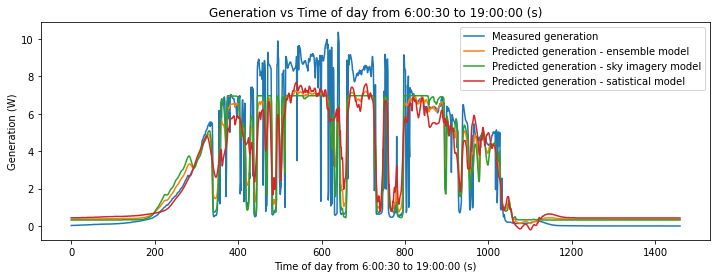

1.1545279041372243 0.37


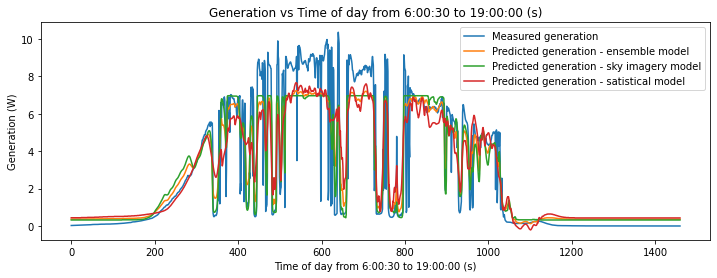

1.156665974800105 0.38


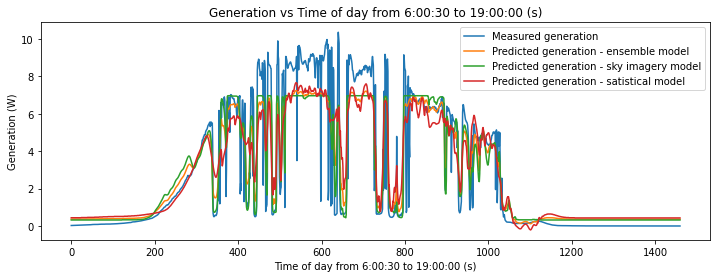

1.1588714259914457 0.39


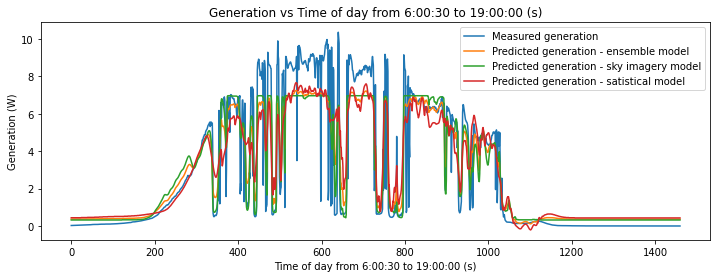

1.1611438737680333 0.4


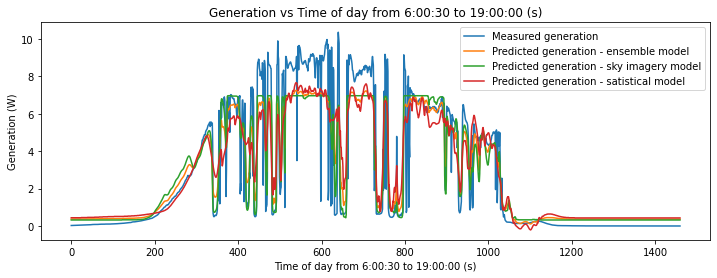

1.1634829255683337 0.41


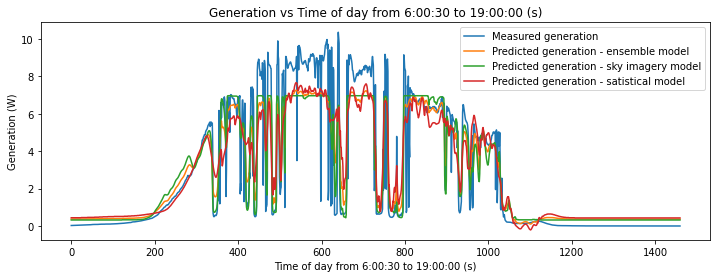

1.165888180521386 0.42


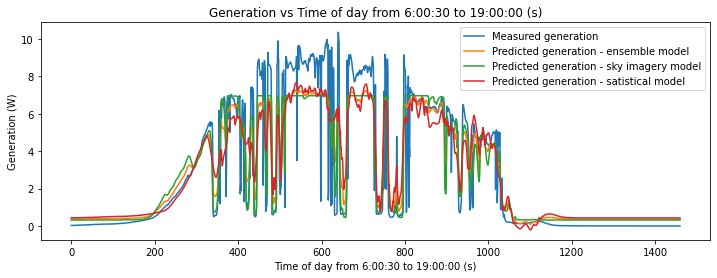

1.1683592297578156 0.43


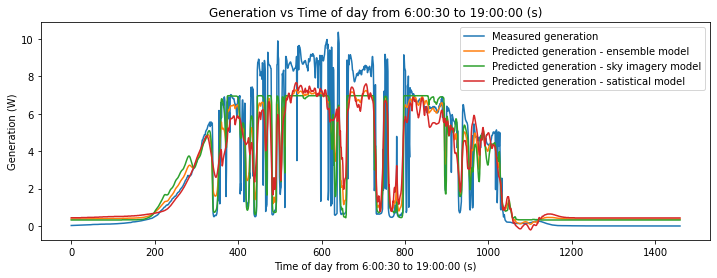

1.1708956567224542 0.44


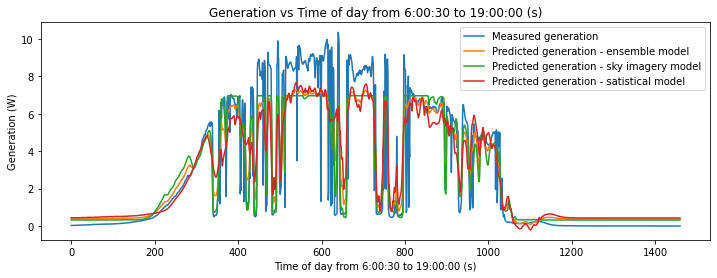

1.1734970374880198 0.45


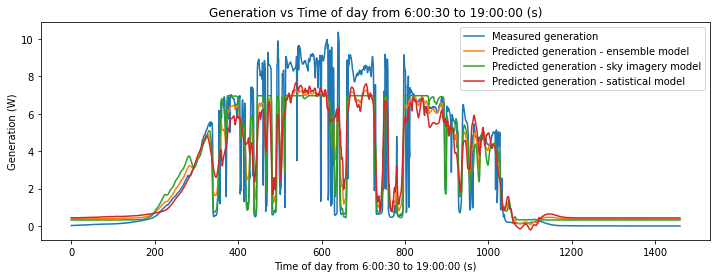

1.1761629410694803 0.46


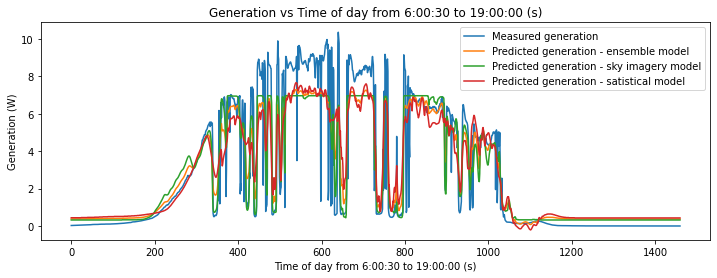

1.1788929297386073 0.47


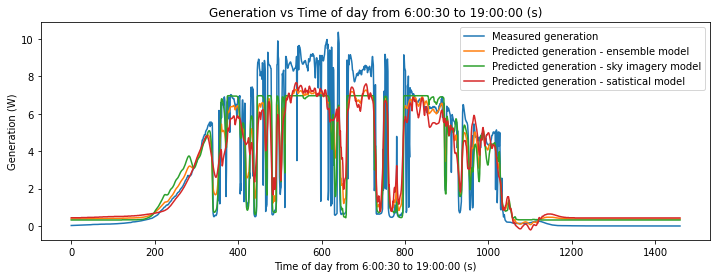

1.1816865593381984 0.48


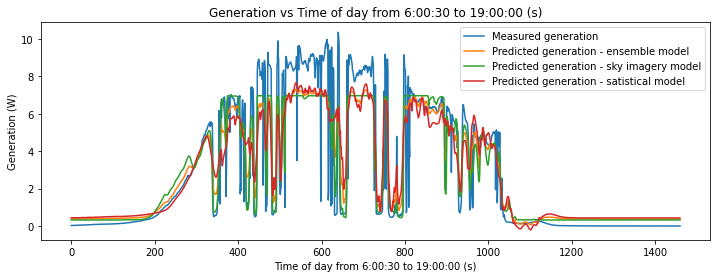

1.1845433795956344 0.49


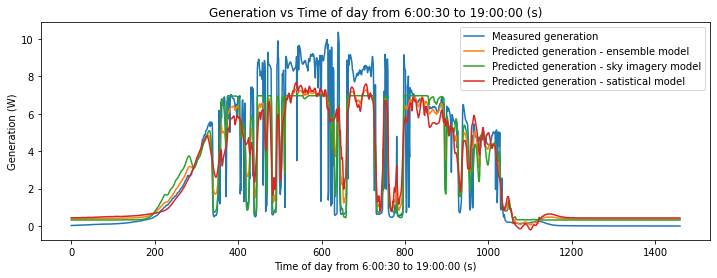

1.1874629344352325 0.5


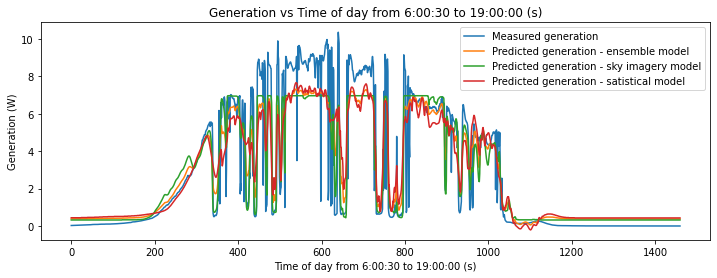

1.1904447622891419 0.51


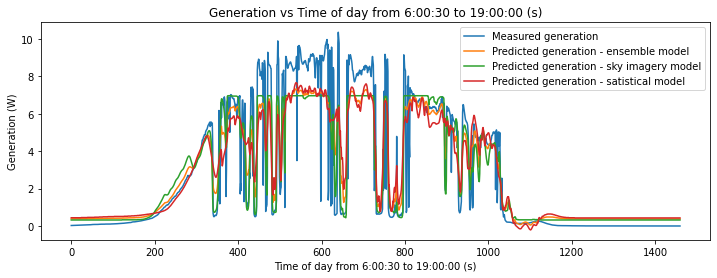

1.1934883964061598 0.52


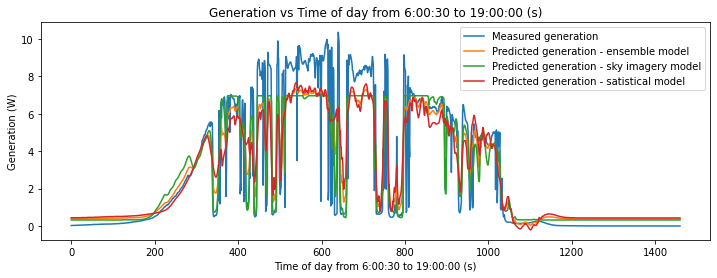

1.1965933651583978 0.53


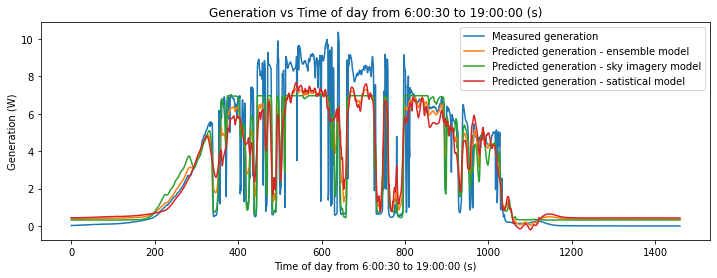

1.1997591923450506 0.54


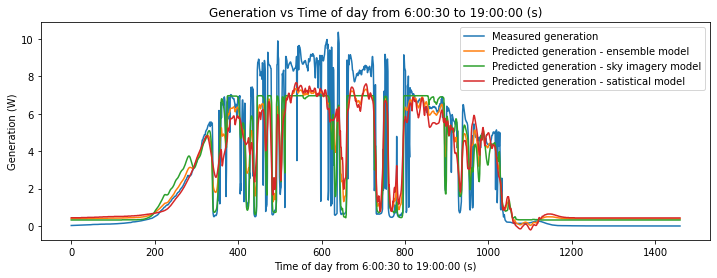

1.2029853974933424 0.55


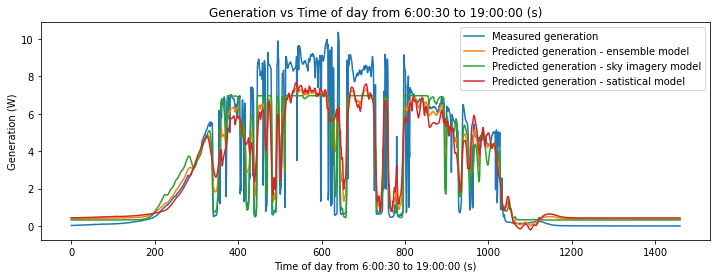

1.20627149615597 0.56


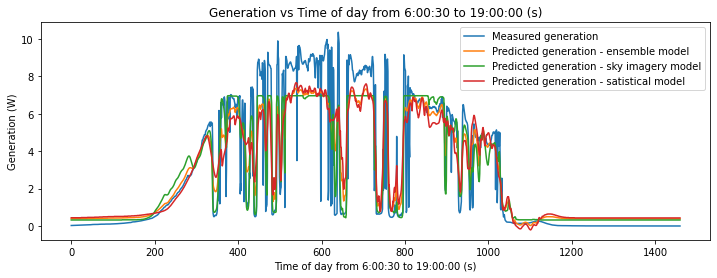

1.209617000205007 0.57


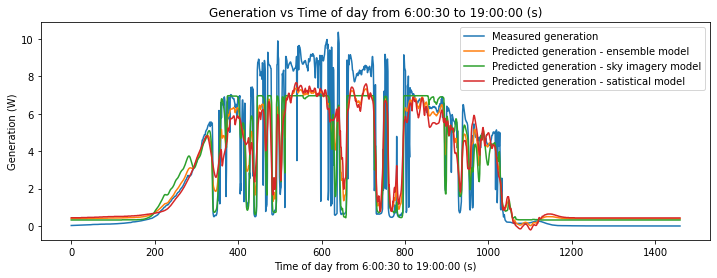

1.2130214181216852 0.58


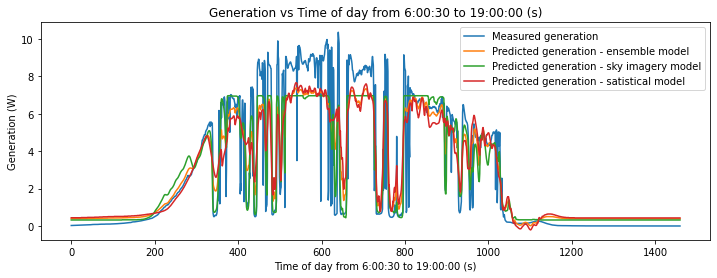

1.2164842552821298 0.59


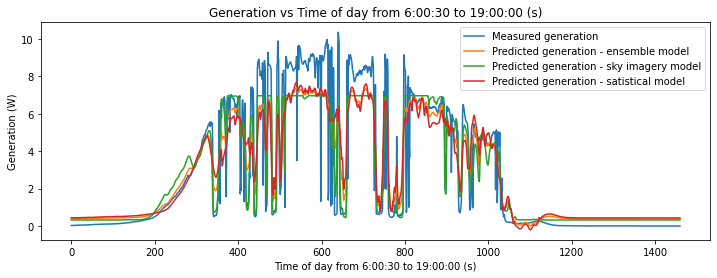

1.2200050142385102 0.6


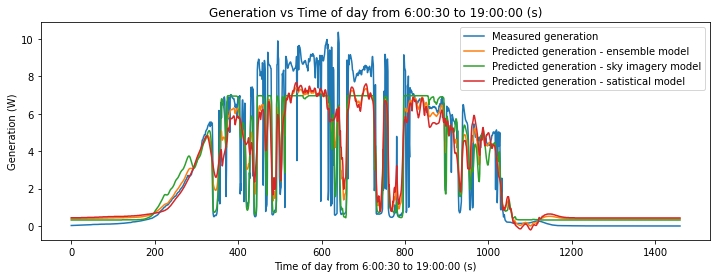

1.2235831949954739 0.61


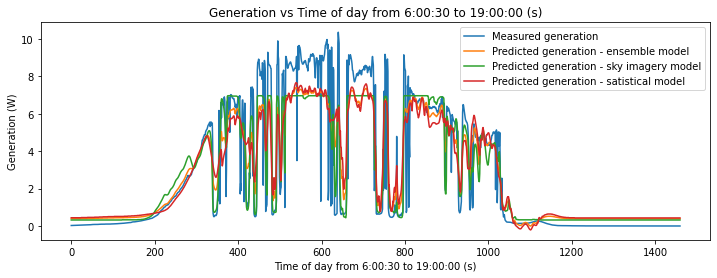

1.2272182952816435 0.62


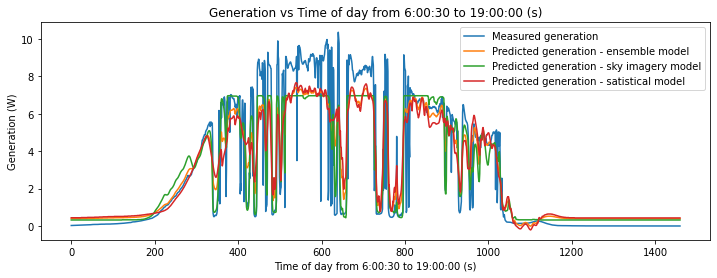

1.2309098108159662 0.63


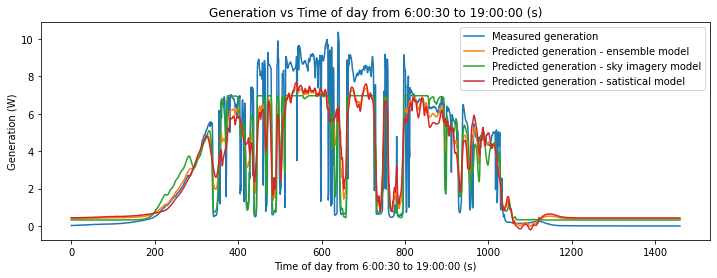

1.2346572355688312 0.64


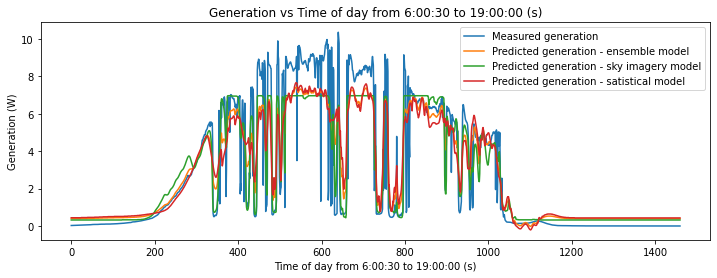

1.2384600620174737 0.65


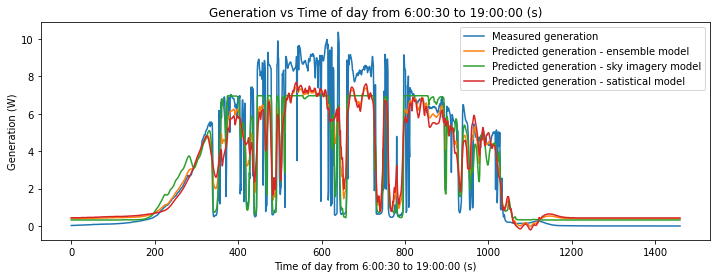

1.2423177813959725 0.66


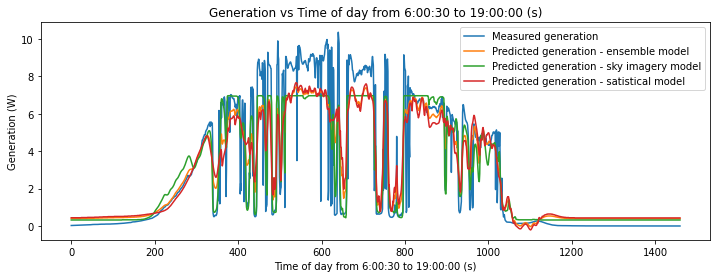

1.2462298839392671 0.67


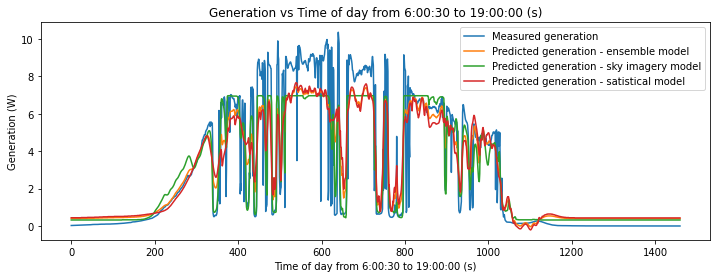

1.2501958591214377 0.68


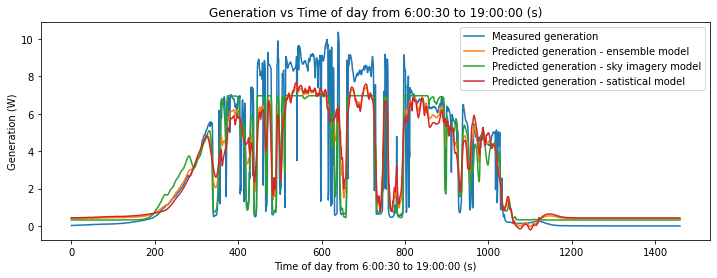

1.2542151958878052 0.69


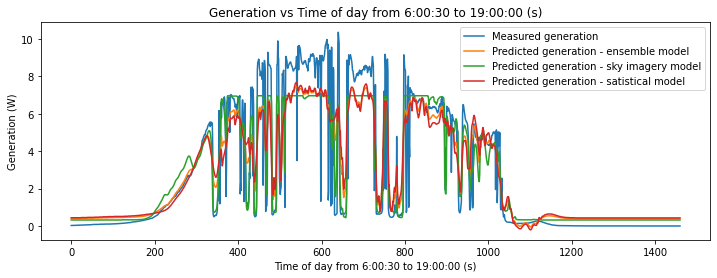

1.258287382881113 0.7


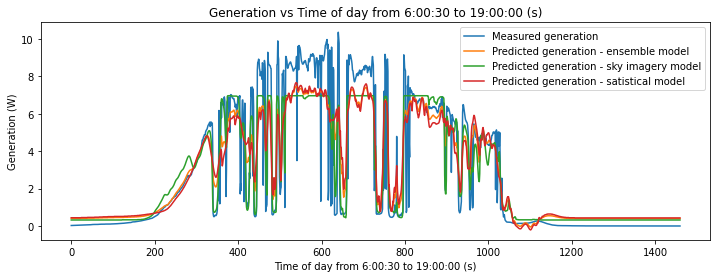

1.2624119086614154 0.71


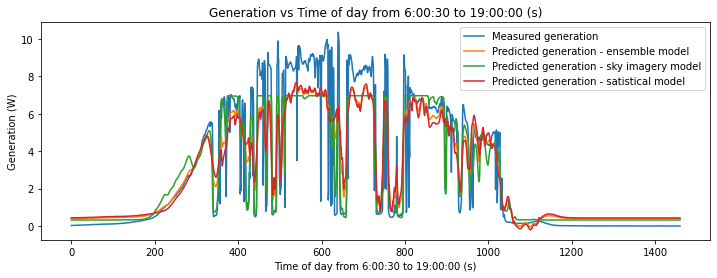

1.26658826191975 0.72


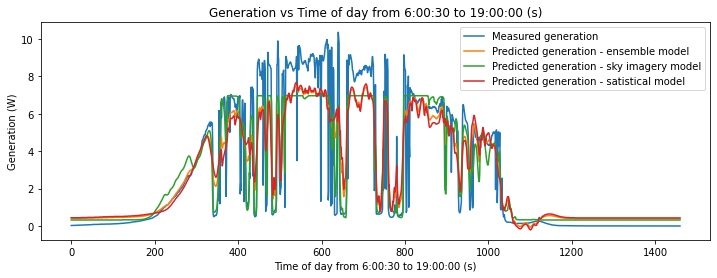

1.2708159316856376 0.73


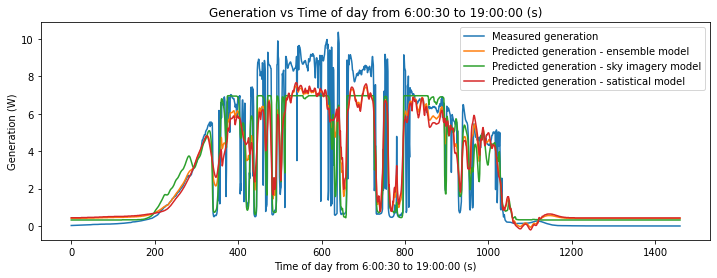

1.2750944075281563 0.74


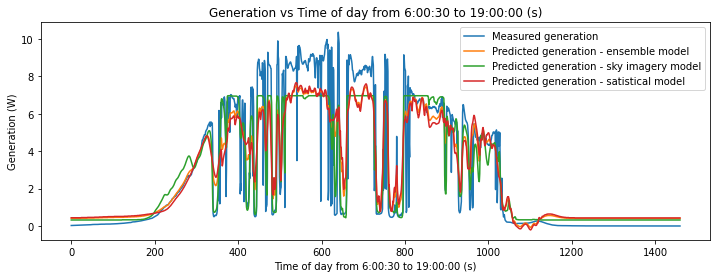

1.2794231797507714 0.75


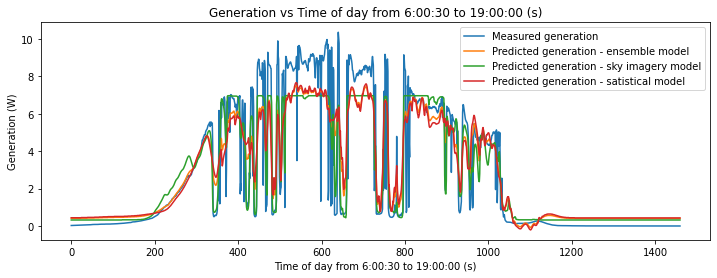

1.2838017395797352 0.76


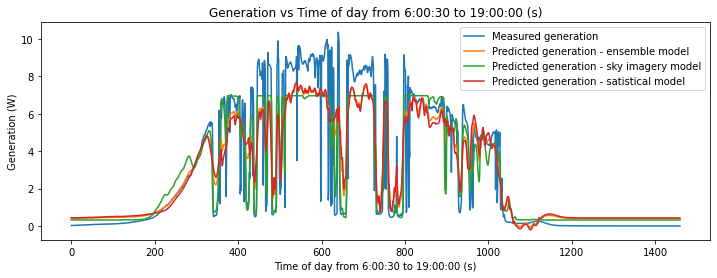

1.2882295793463021 0.77


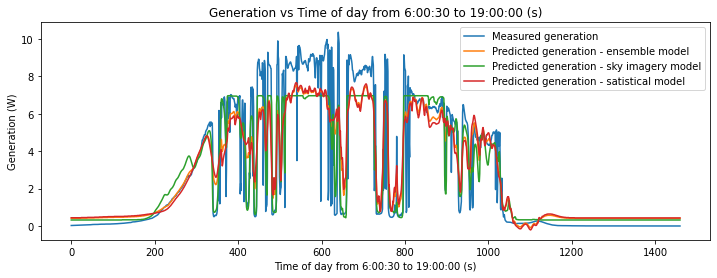

1.292706192662483 0.78


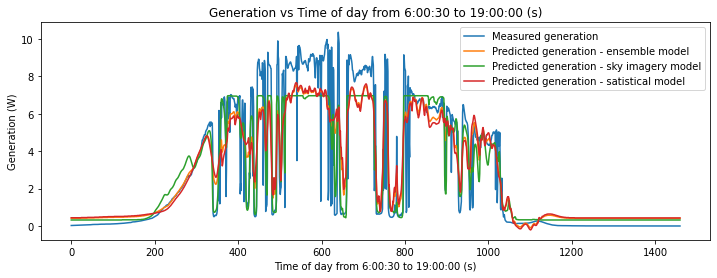

1.2972310745906281 0.79


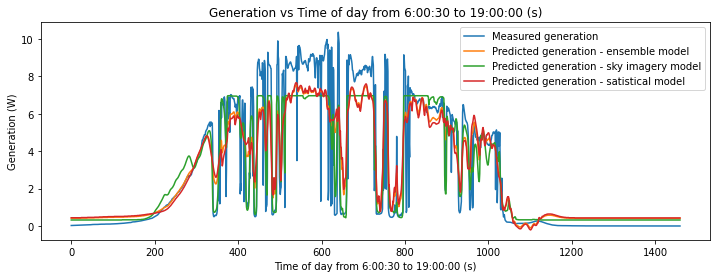

1.301803721806623 0.8


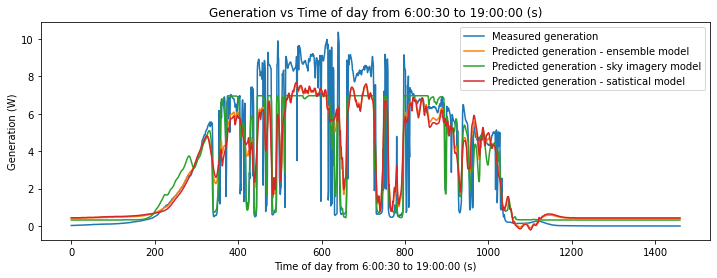

1.306423632757023 0.81


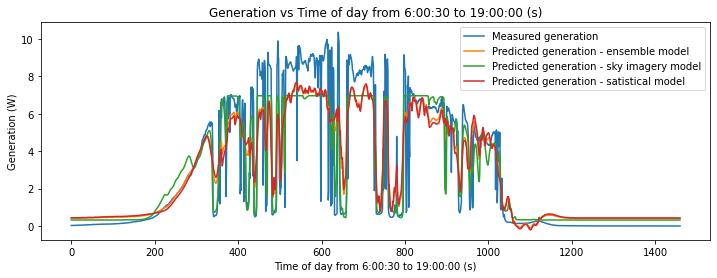

1.3110903078098288 0.82


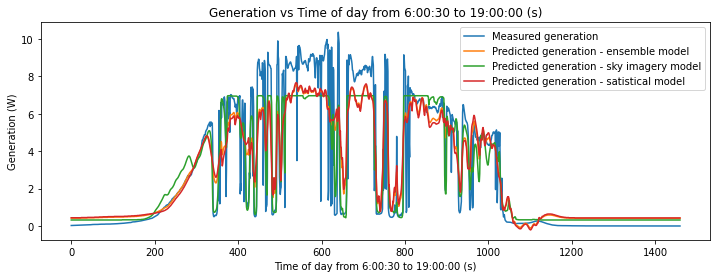

1.3158032493994432 0.83


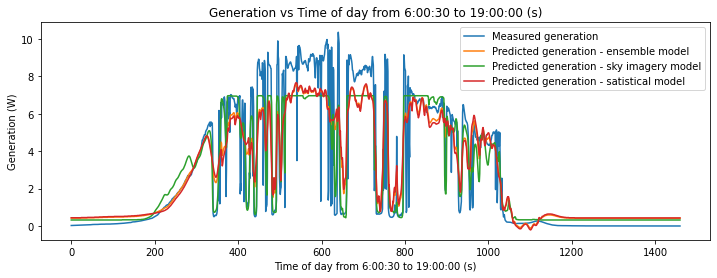

1.320561962165278 0.84


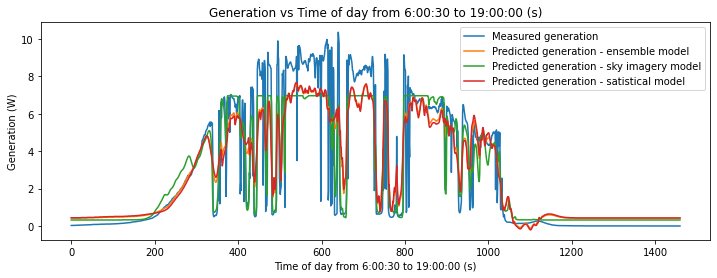

1.3253659530846207 0.85


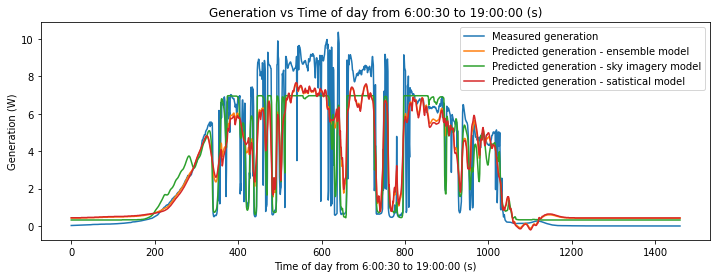

1.3302147315995094 0.86


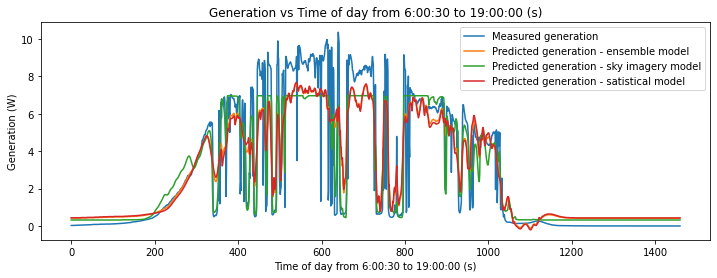

1.3351078097379565 0.87


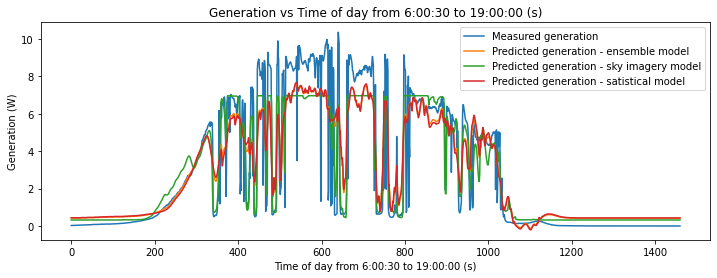

1.3400447022292257 0.88


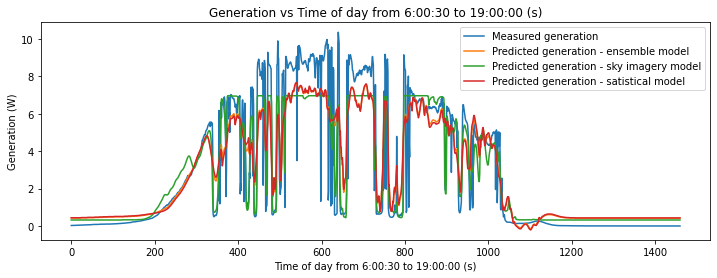

1.345024926613746 0.89


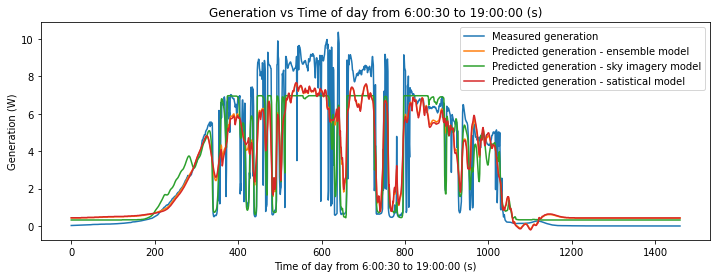

1.3500480033474564 0.9


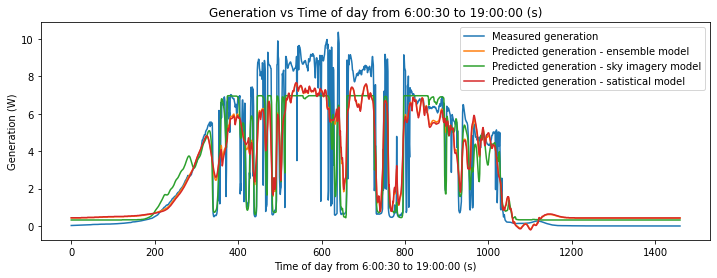

1.355113455900652 0.91


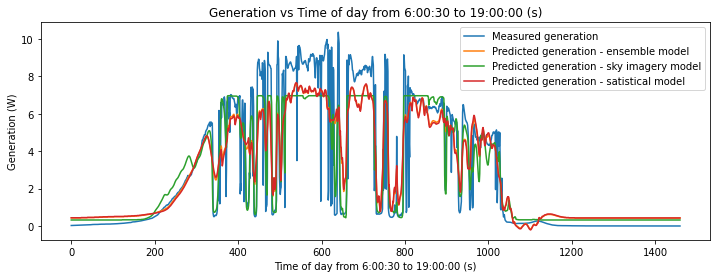

1.3602208108516667 0.92


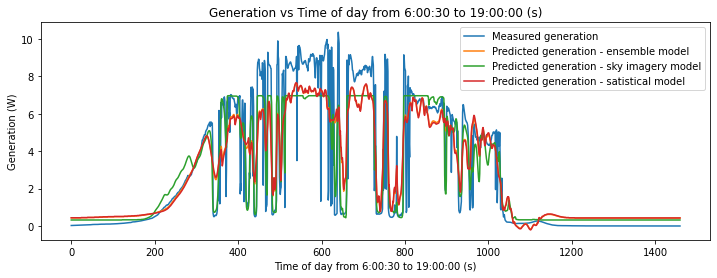

1.3653695979753402 0.93


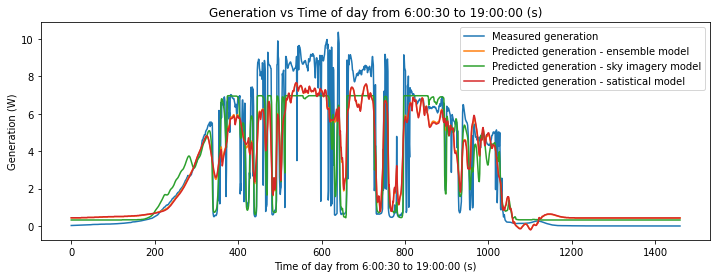

1.370559350326399 0.94


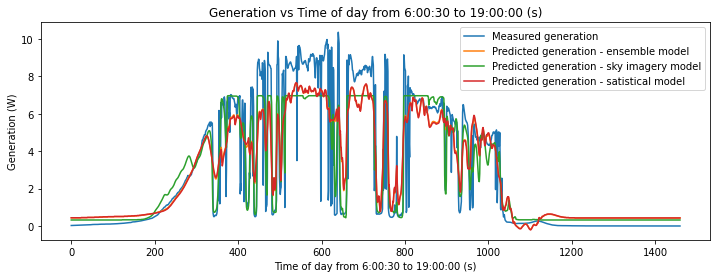

1.3757896043179392 0.95


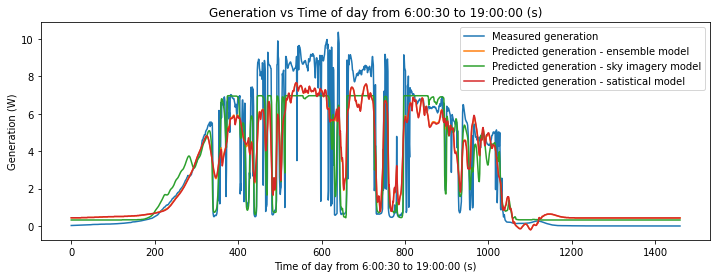

1.3810598997950498 0.96


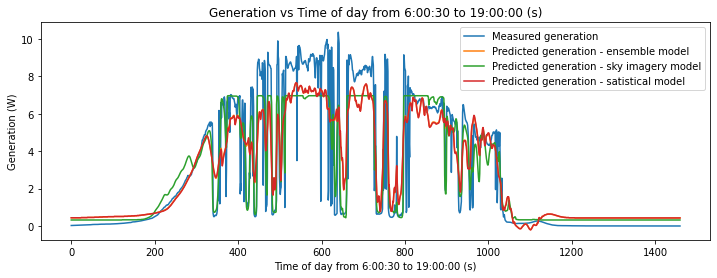

1.3863697801037569 0.97


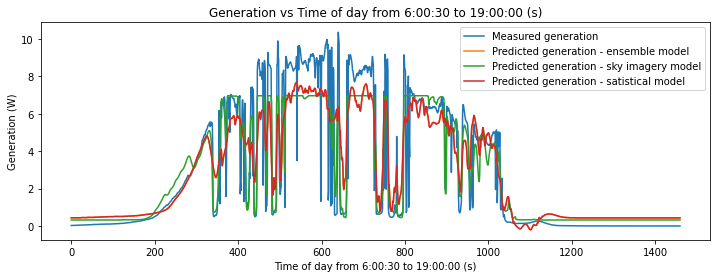

1.39171879215536 0.98


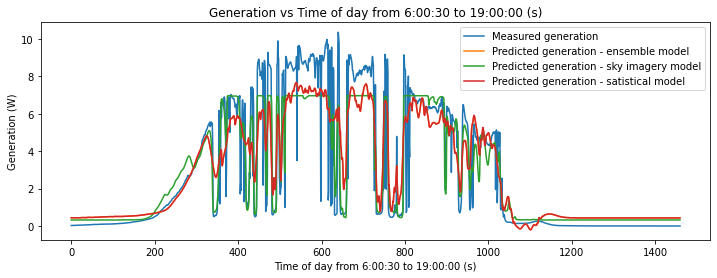

1.3971064864863385 0.99


In [ ]:
count = 0
for ensemble1 in ensemble:
  plt.figure(figsize=(12,4))
  #
  plt.plot( list(Expected1))
  plt.plot(ensemble1)
  plt.plot(predn)
  plt.plot(predn1)
  plt.title("Generation vs Time of day from 6:00:30 to 19:00:00 (s)")
  plt.ylabel("Generation (W)")
  plt.xlabel("Time of day from 6:00:30 to 19:00:00 (s)")
  plt.legend(('Measured generation','Predicted generation - ensemble model', 'Predicted generation - sky imagery model', 'Predicted generation - satistical model'))
  plt.show()
  print(RMSE[count], weights_list[count])
  count +=1

In [ ]:
weights_list = list(range(0,100,1))

100 100


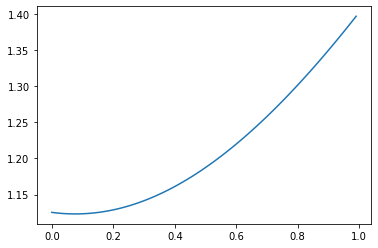

In [ ]:

weights_list = list(map(lambda x: x/100,weights_list))
print(len(weights_list),len(RMSE))
plt.plot( weights_list,RMSE)
# plt.plot()

In [ ]:
weights_list

In [ ]:
RMSE

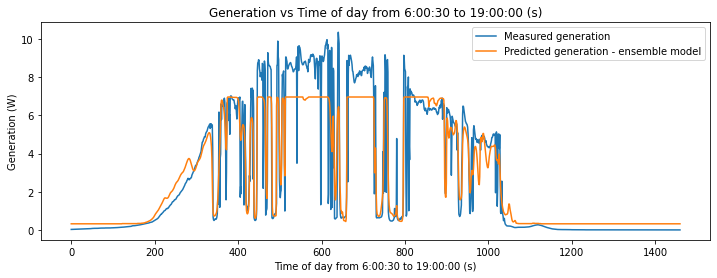

1.1253050634054882 0.0


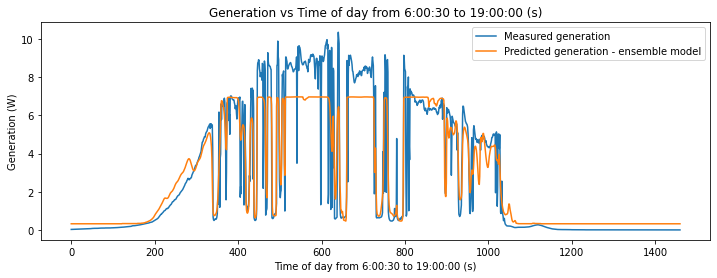

1.1247828913215172 0.01


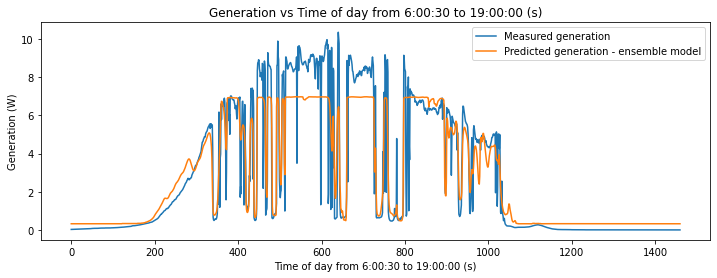

1.1243339932527028 0.02


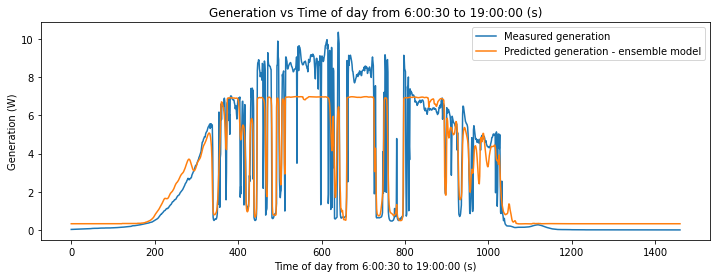

1.1239584569938277 0.03


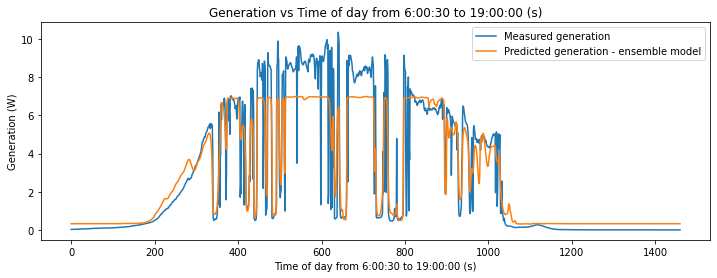

1.123656356099471 0.04


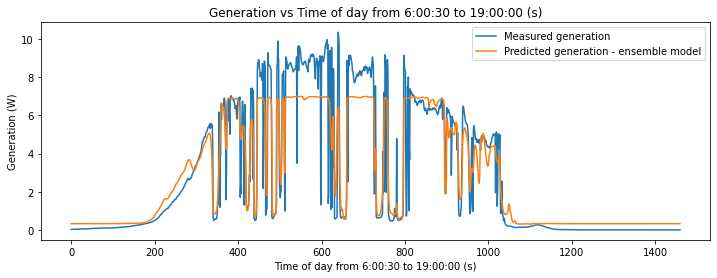

1.123427749812126 0.05


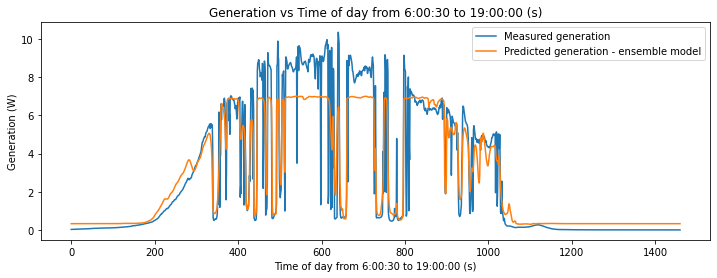

1.123272683004249 0.06


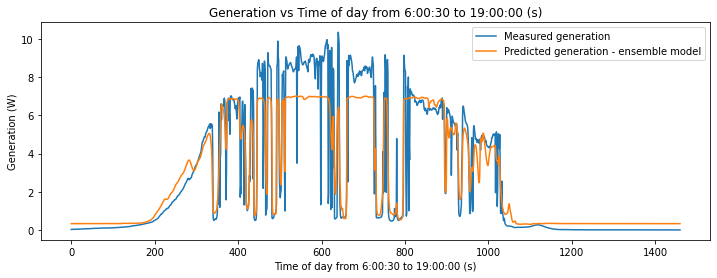

1.1231911861342132 0.07


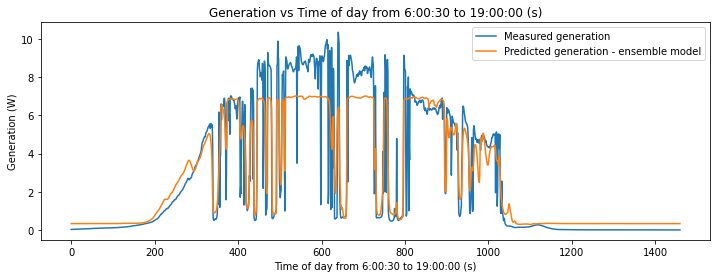

1.1231832752164819 0.08


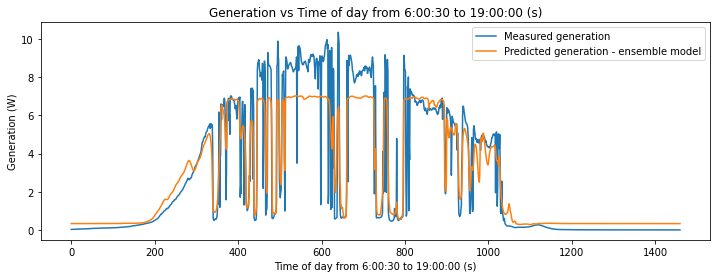

1.1232489518058235 0.09


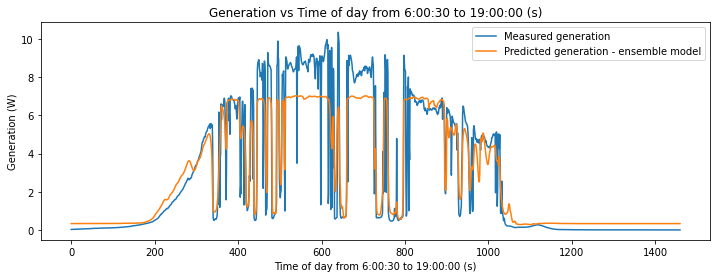

1.1233882029958007 0.1


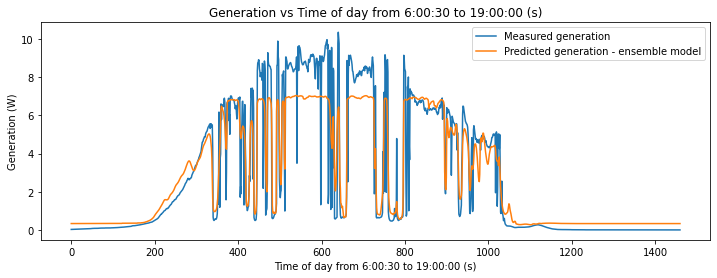

1.1236010014314737 0.11


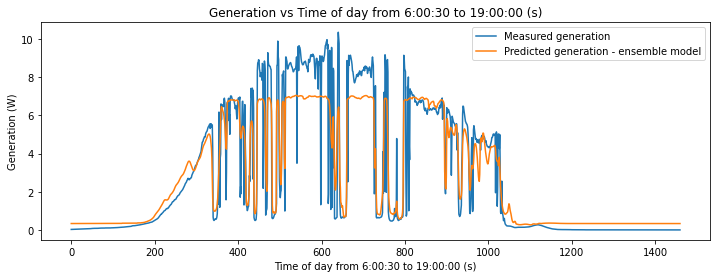

1.123887305336211 0.12


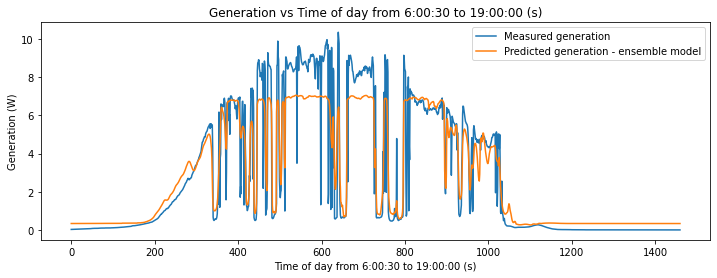

1.124247058552698 0.13


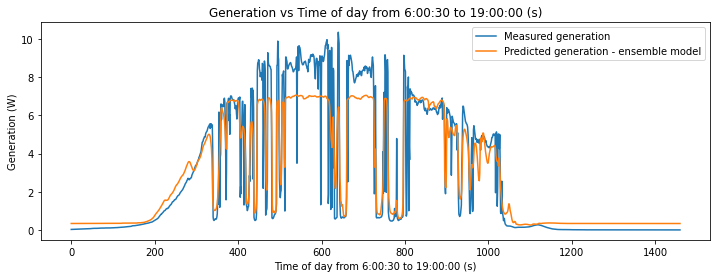

1.124680190597883 0.14


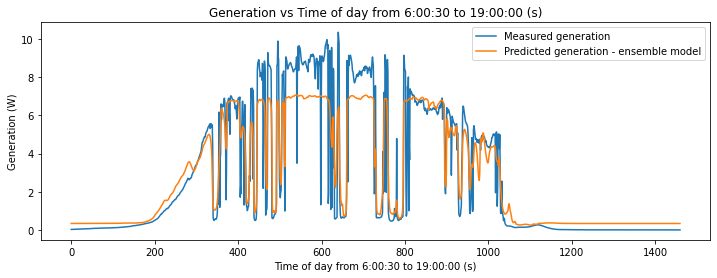

1.125186616731911 0.15


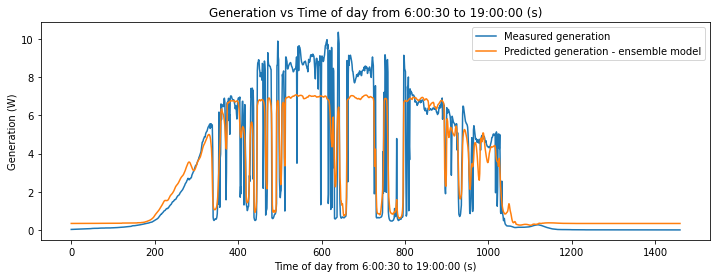

1.1257662380407023 0.16


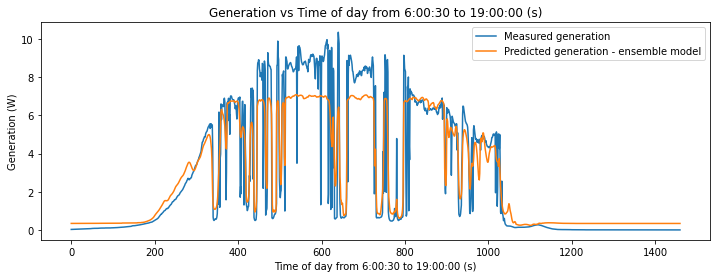

1.1264189415321704 0.17


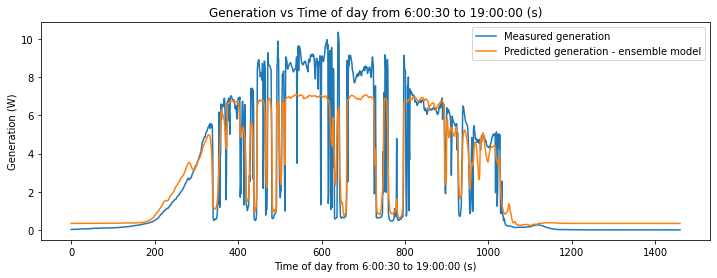

1.1271446002456882 0.18


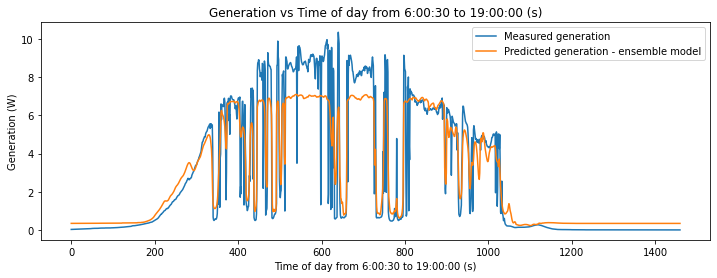

1.1279430733747002 0.19


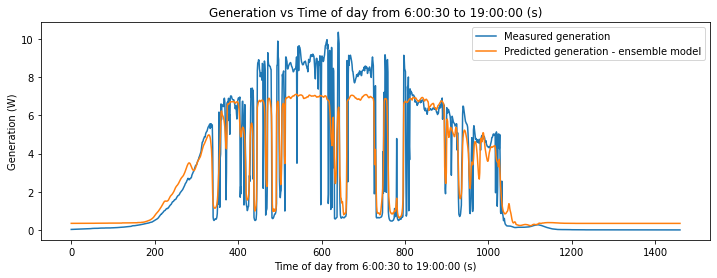

1.1288142064021685 0.2


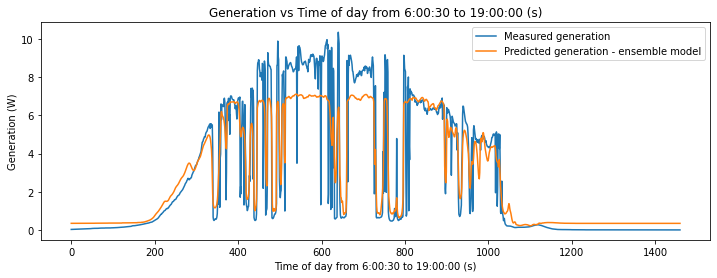

1.129757831248418 0.21


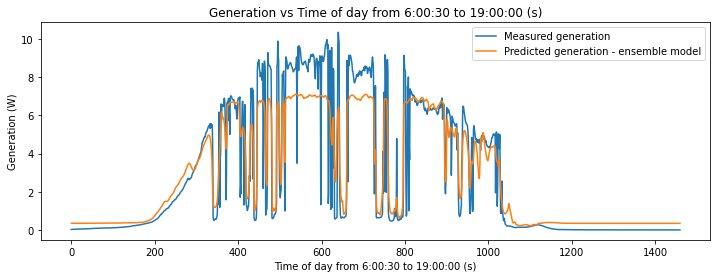

1.1307737664313413 0.22


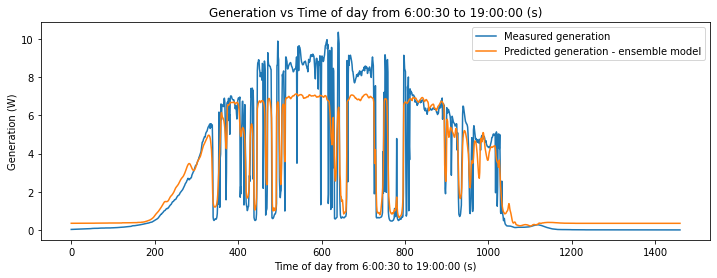

1.131861817238268 0.23


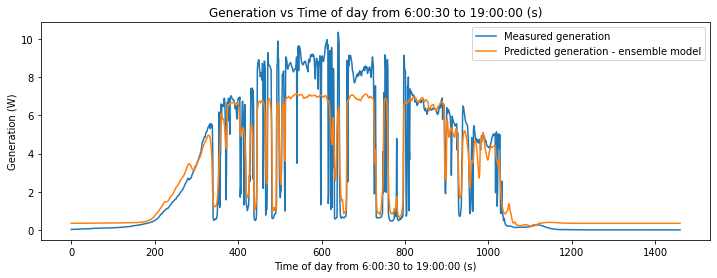

1.1330217759094199 0.24


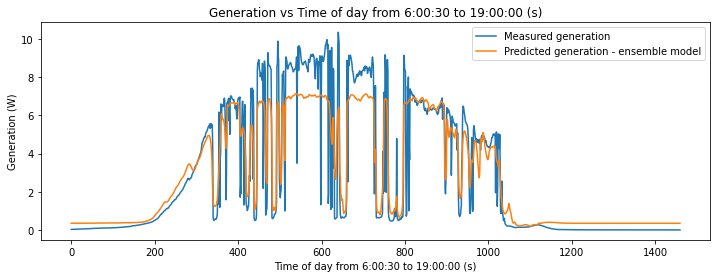

1.1342534218323403 0.25


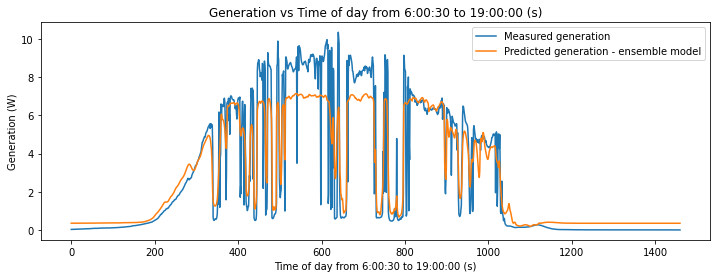

1.1355565217470283 0.26


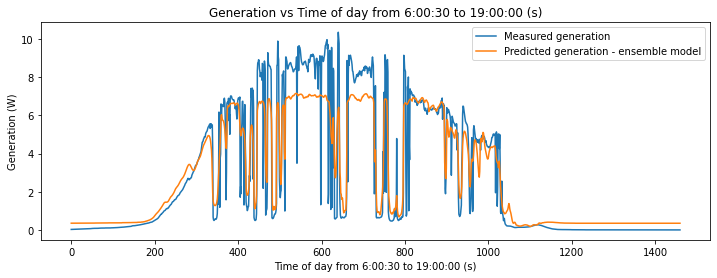

1.1369308299612773 0.27


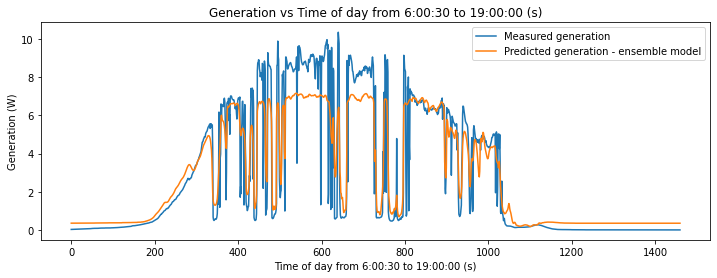

1.1383760885757803 0.28


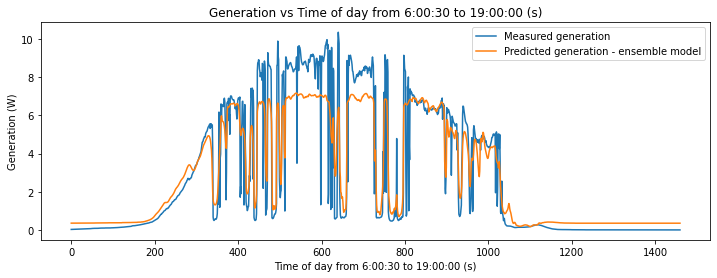

1.1398920277184872 0.29


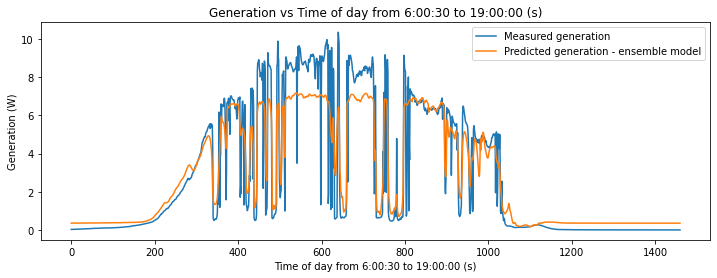

1.1414783657878231 0.3


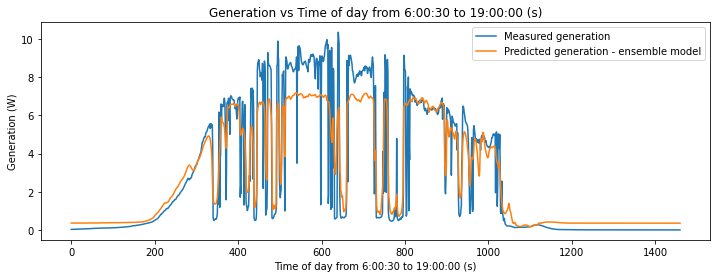

1.1431348097042302 0.31


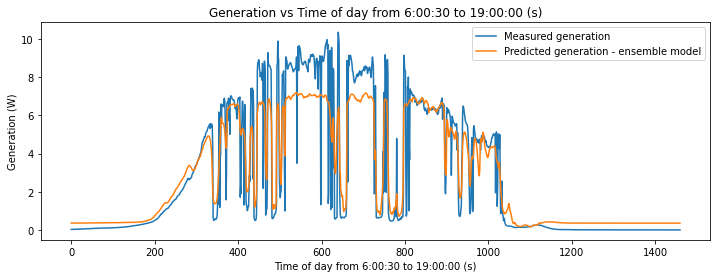

1.1448610551695055 0.32


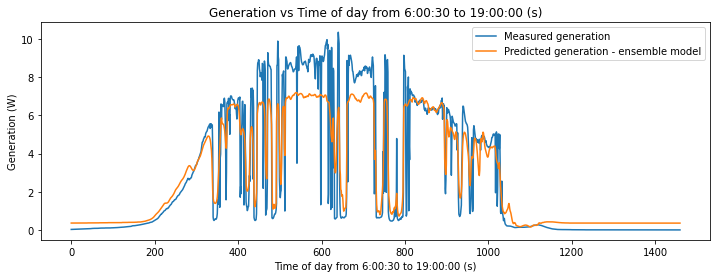

1.1466567869334496 0.33


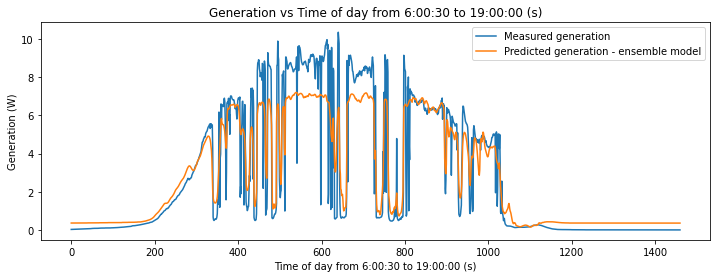

1.148521679067345 0.34


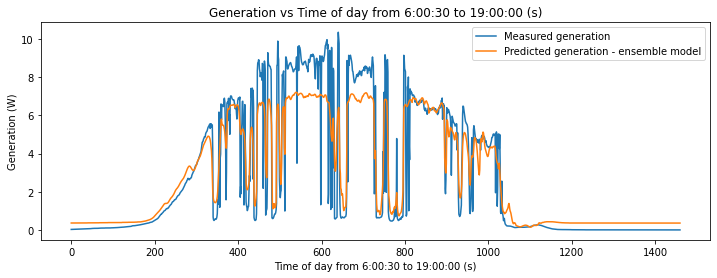

1.1504553952436445 0.35


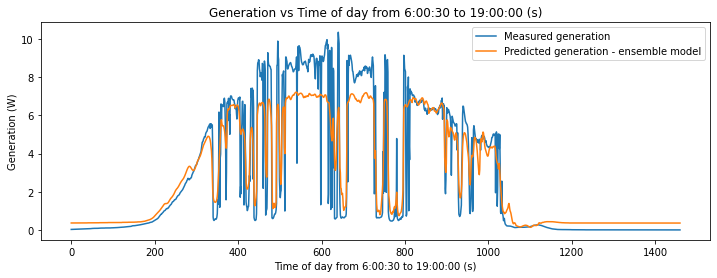

1.1524575890214517 0.36


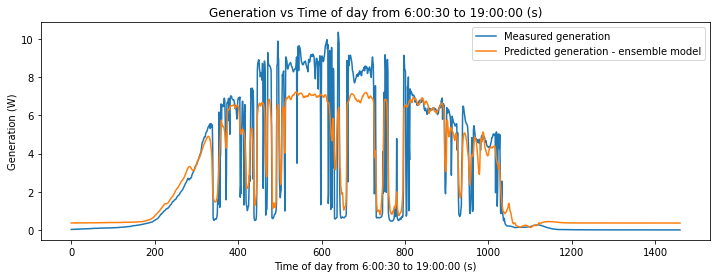

1.1545279041372243 0.37


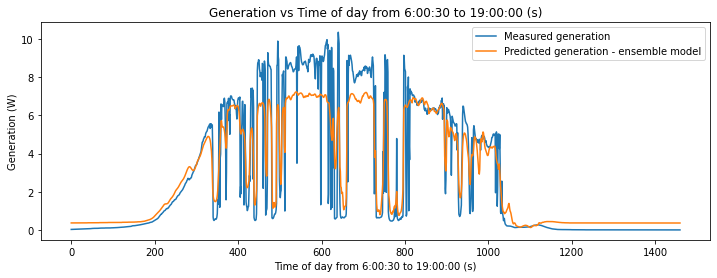

1.156665974800105 0.38


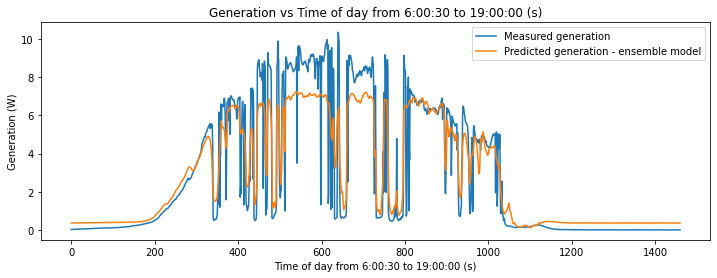

1.1588714259914457 0.39


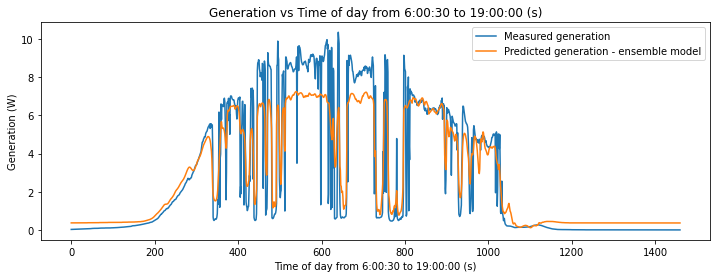

1.1611438737680333 0.4


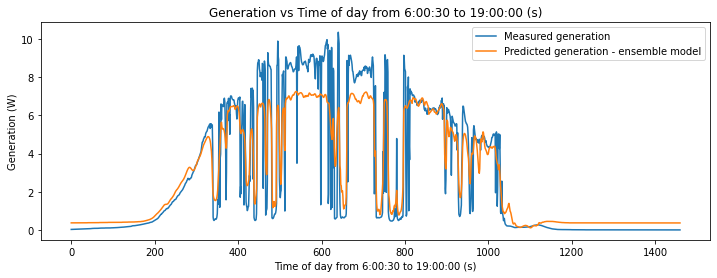

1.1634829255683337 0.41


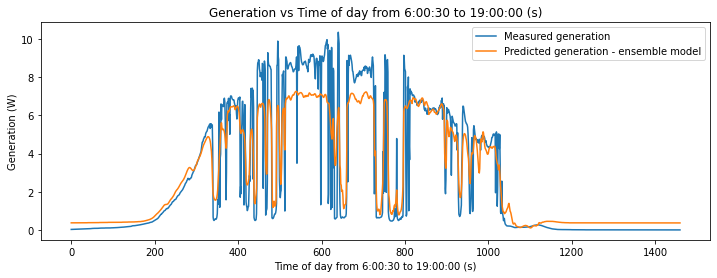

1.165888180521386 0.42


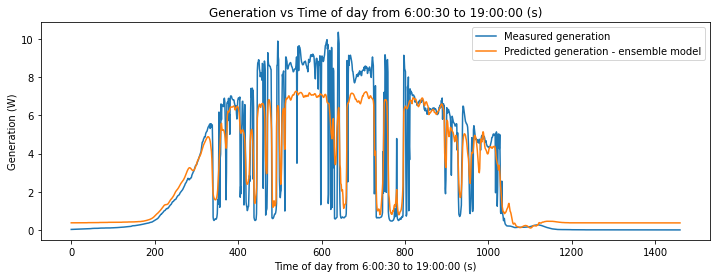

1.1683592297578156 0.43


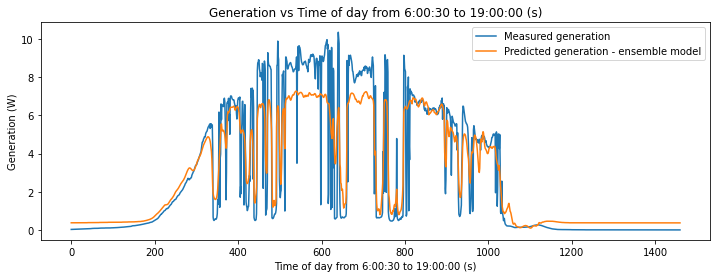

1.1708956567224542 0.44


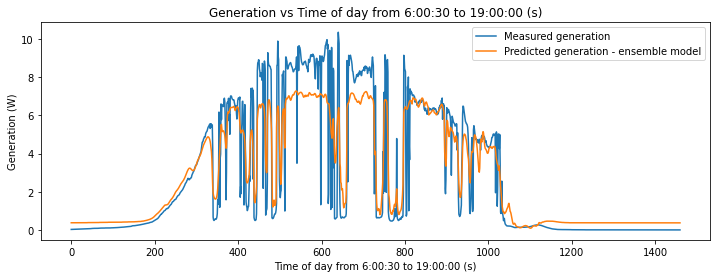

1.1734970374880198 0.45


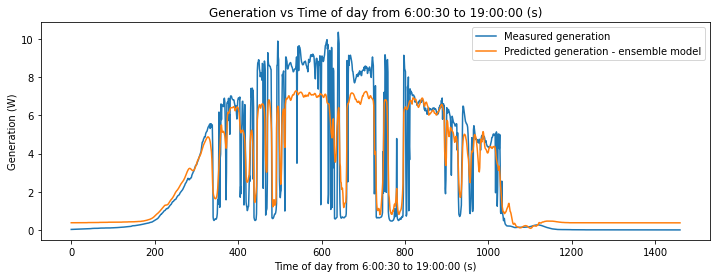

1.1761629410694803 0.46


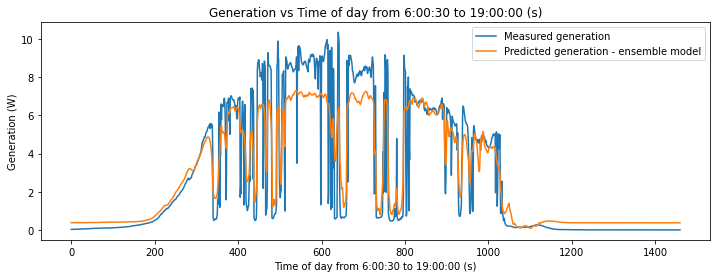

1.1788929297386073 0.47


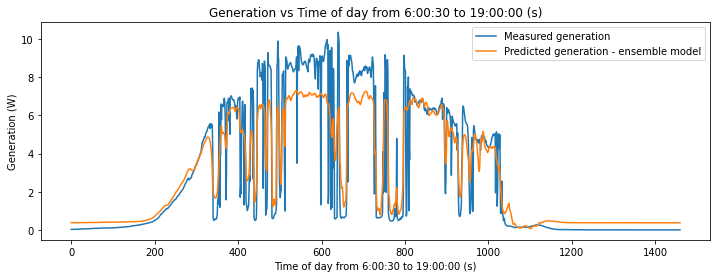

1.1816865593381984 0.48


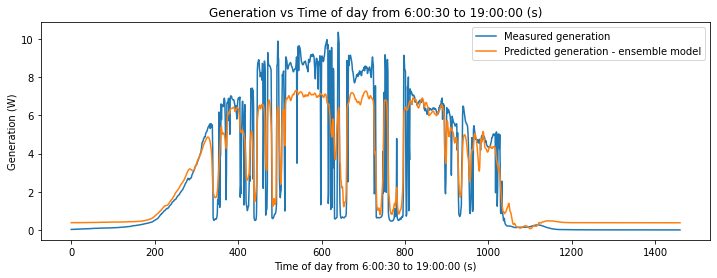

1.1845433795956344 0.49


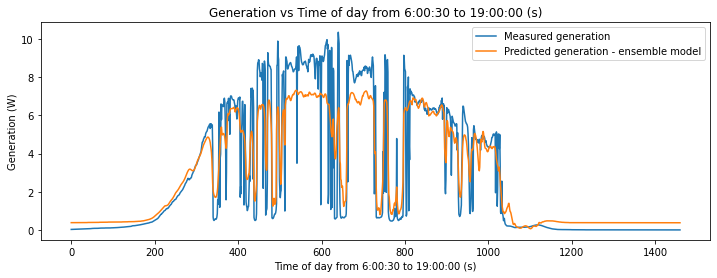

1.1874629344352325 0.5


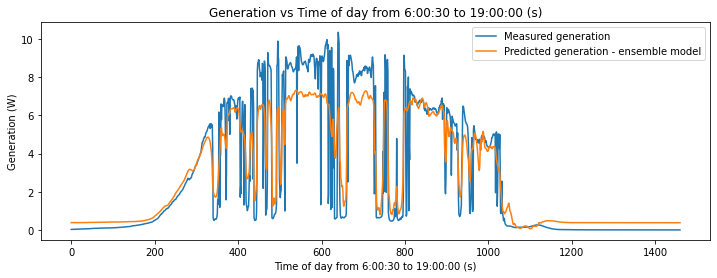

1.1904447622891419 0.51


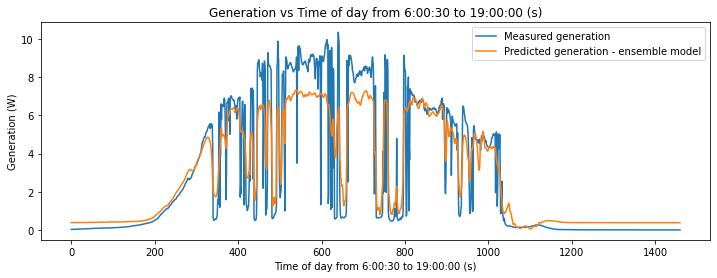

1.1934883964061598 0.52


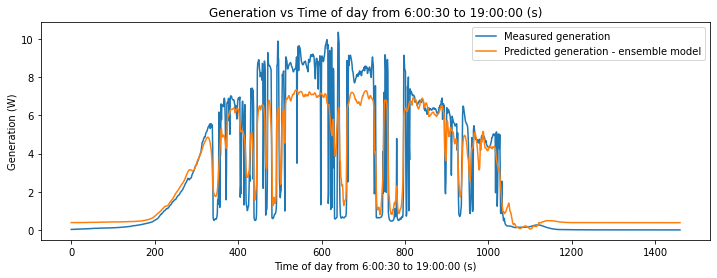

1.1965933651583978 0.53


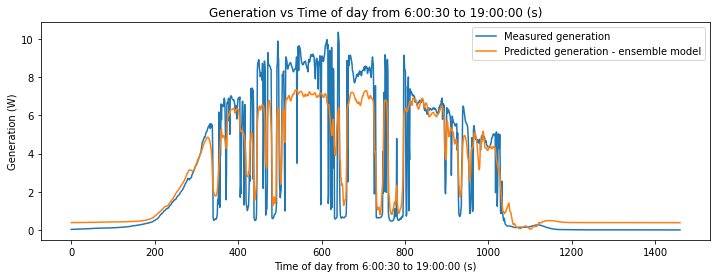

1.1997591923450506 0.54


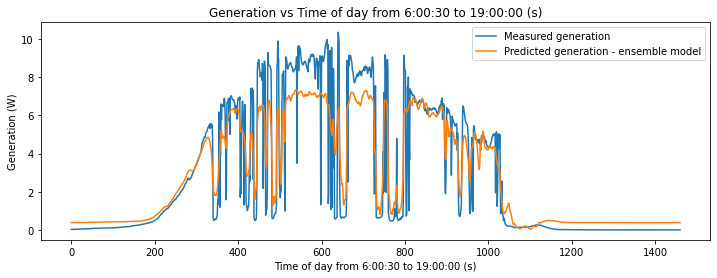

1.2029853974933424 0.55


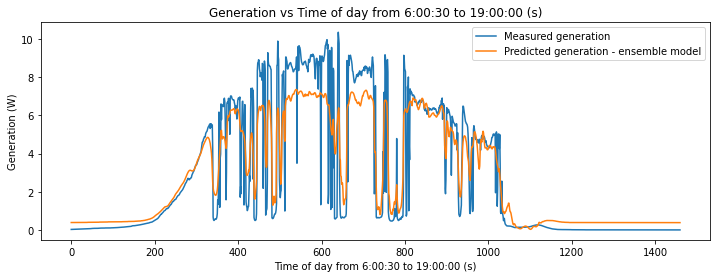

1.20627149615597 0.56


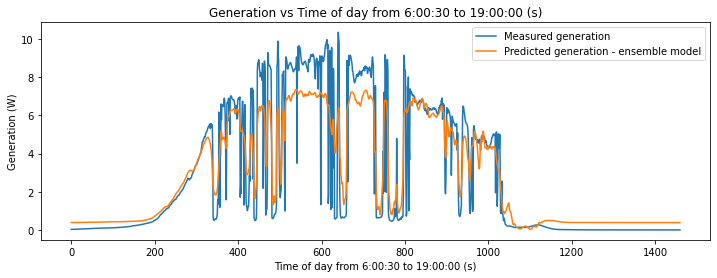

1.209617000205007 0.57


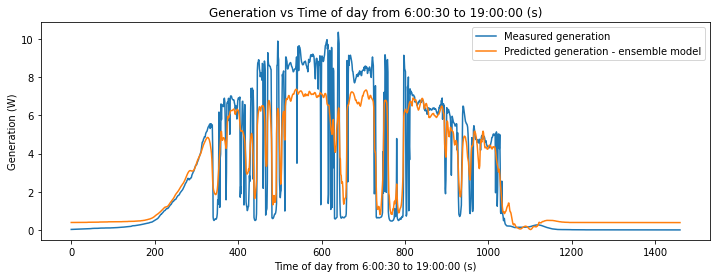

1.2130214181216852 0.58


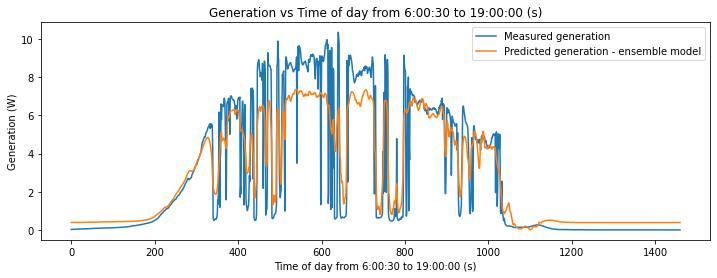

1.2164842552821298 0.59


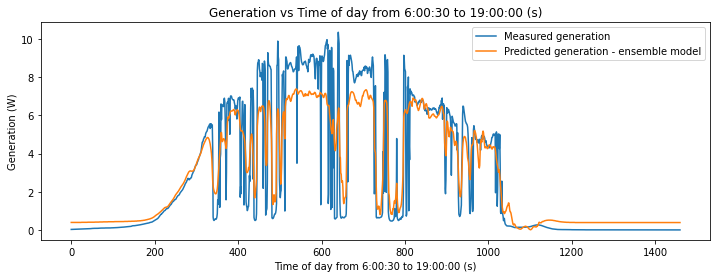

1.2200050142385102 0.6


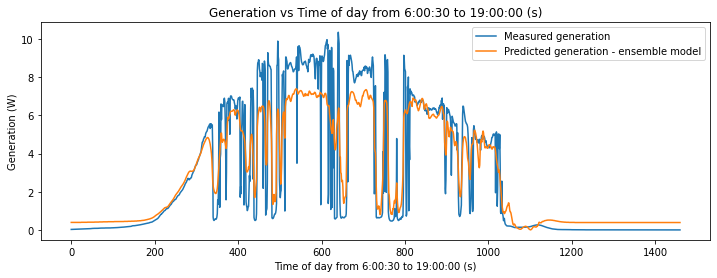

1.2235831949954739 0.61


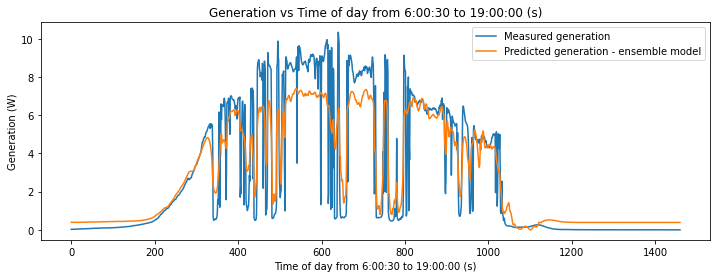

1.2272182952816435 0.62


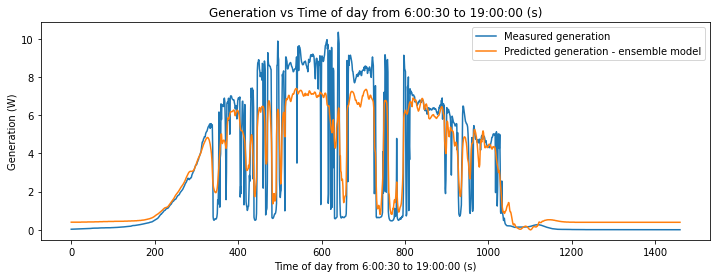

1.2309098108159662 0.63


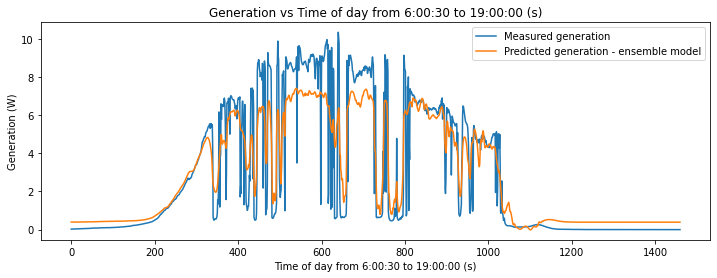

1.2346572355688312 0.64


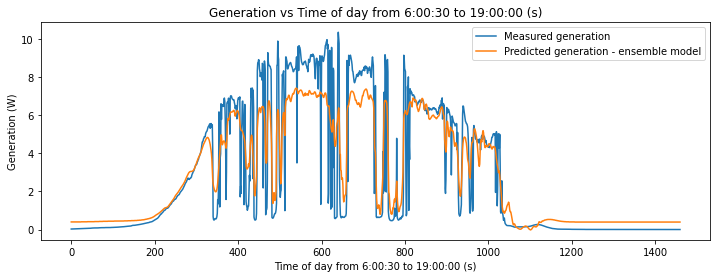

1.2384600620174737 0.65


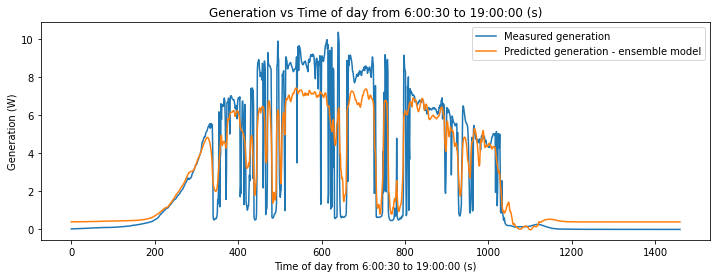

1.2423177813959725 0.66


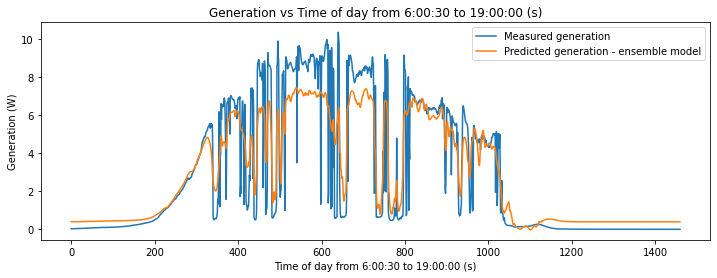

1.2462298839392671 0.67


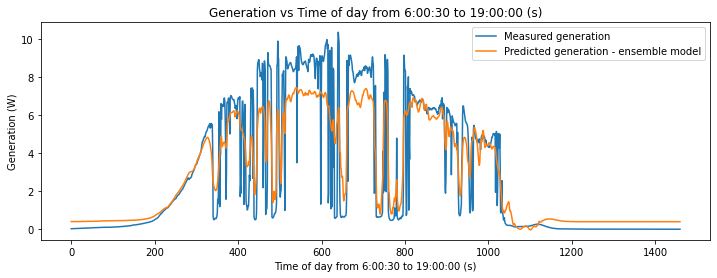

1.2501958591214377 0.68


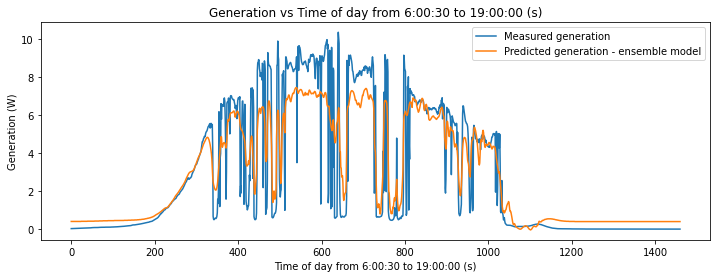

1.2542151958878052 0.69


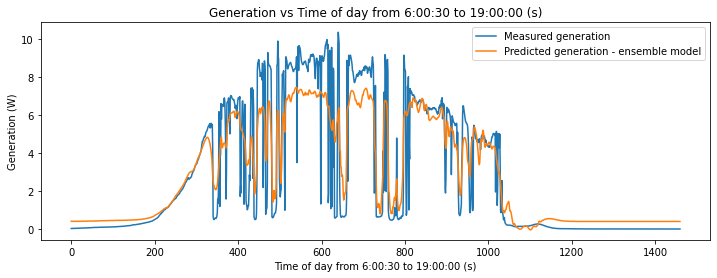

1.258287382881113 0.7


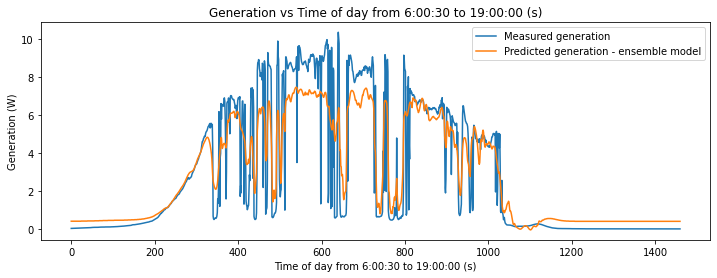

1.2624119086614154 0.71


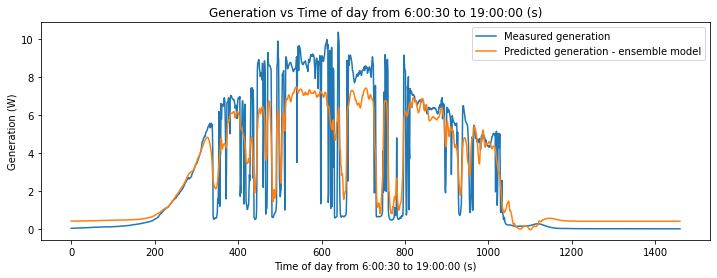

1.26658826191975 0.72


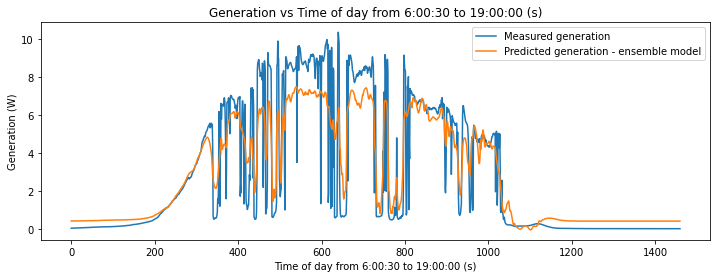

1.2708159316856376 0.73


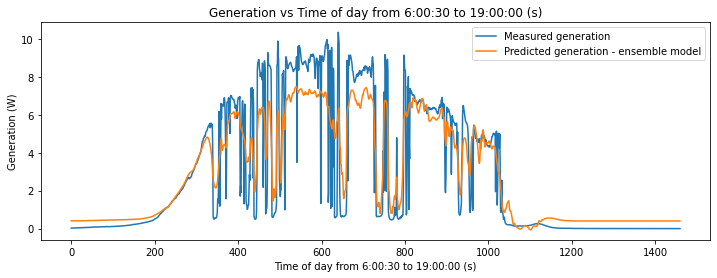

1.2750944075281563 0.74


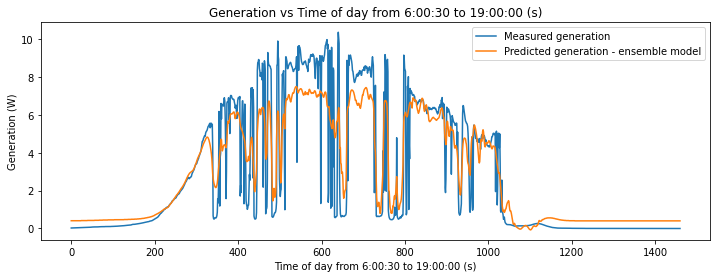

1.2794231797507714 0.75


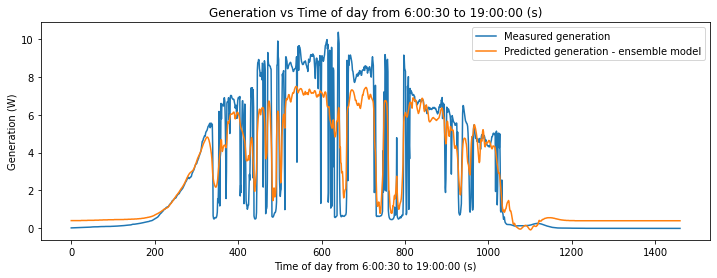

1.2838017395797352 0.76


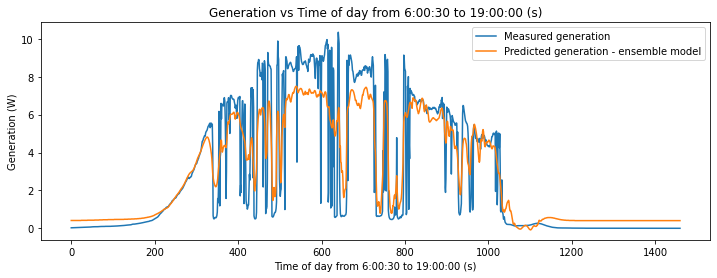

1.2882295793463021 0.77


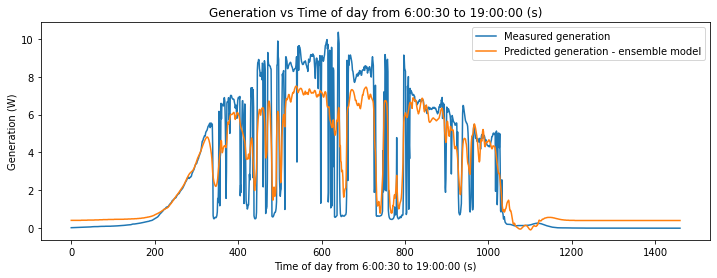

1.292706192662483 0.78


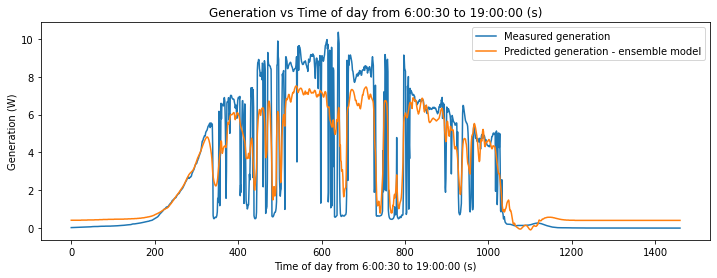

1.2972310745906281 0.79


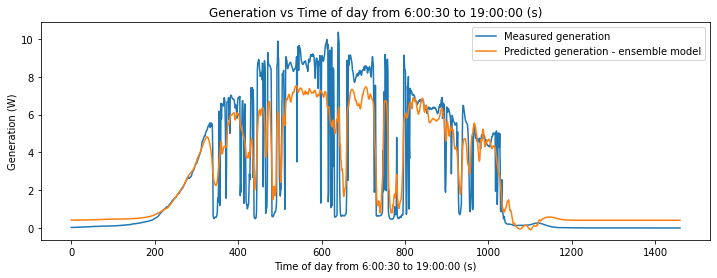

1.301803721806623 0.8


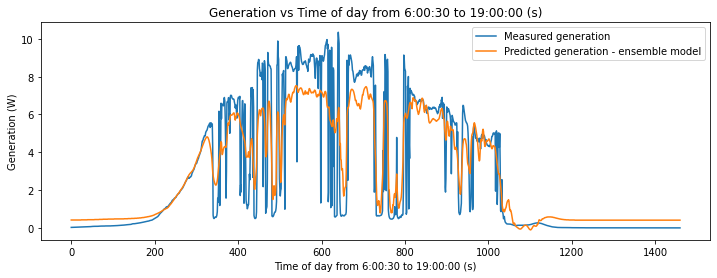

1.306423632757023 0.81


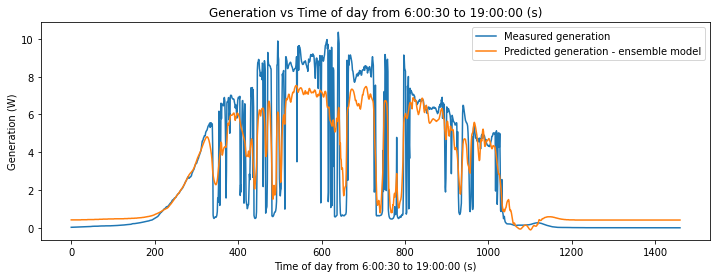

1.3110903078098288 0.82


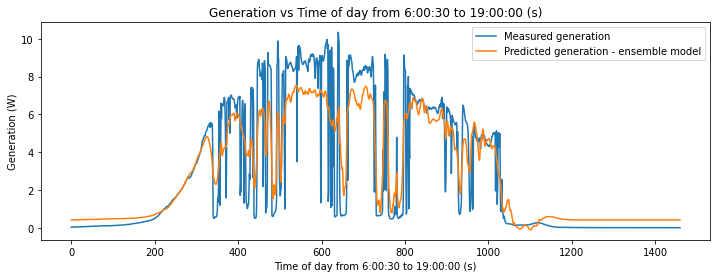

1.3158032493994432 0.83


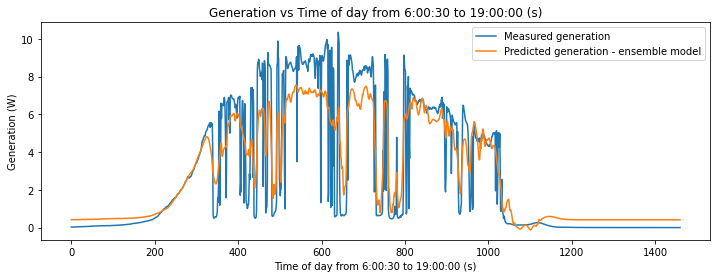

1.320561962165278 0.84


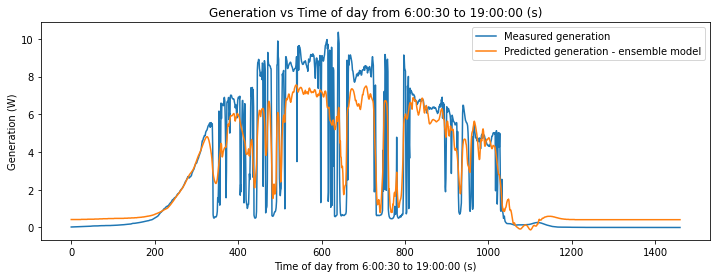

1.3253659530846207 0.85


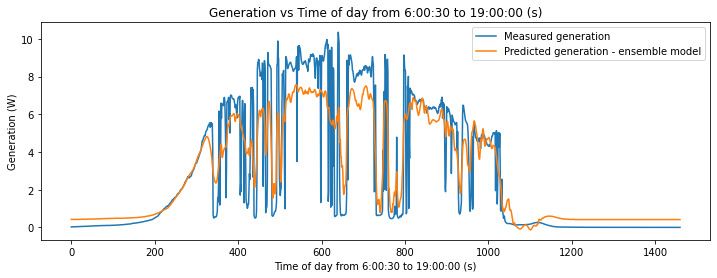

1.3302147315995094 0.86


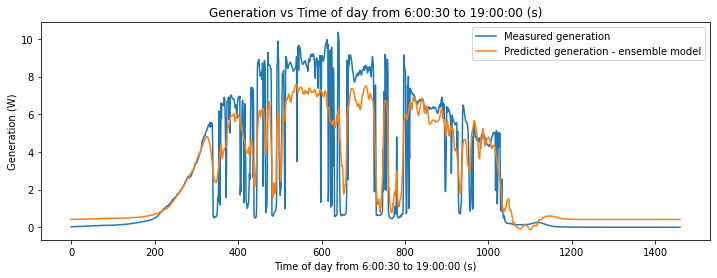

1.3351078097379565 0.87


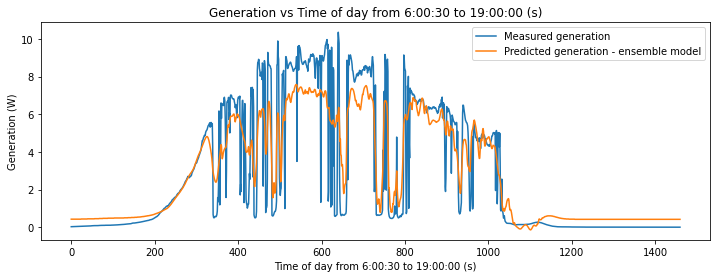

1.3400447022292257 0.88


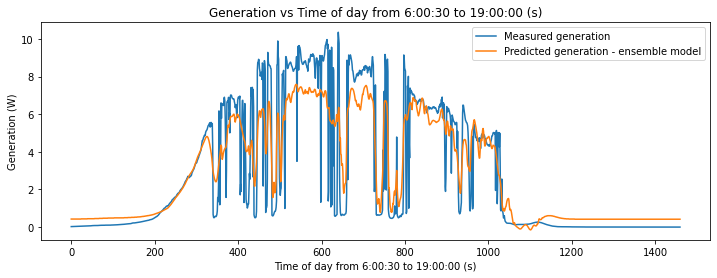

1.345024926613746 0.89


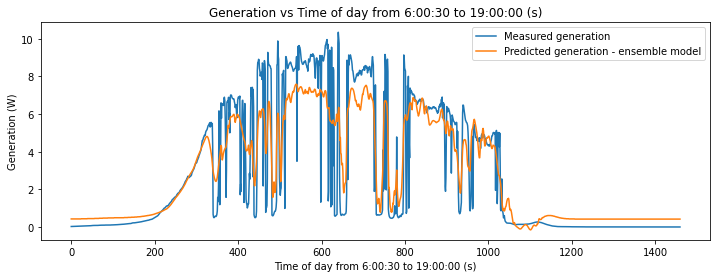

1.3500480033474564 0.9


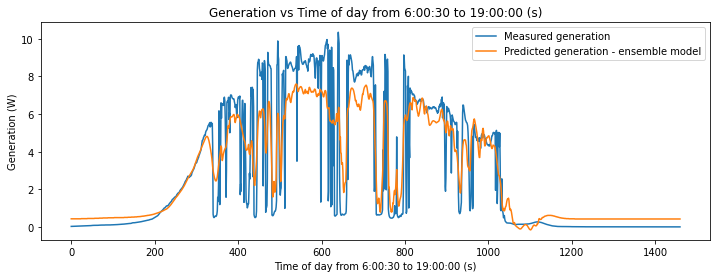

1.355113455900652 0.91


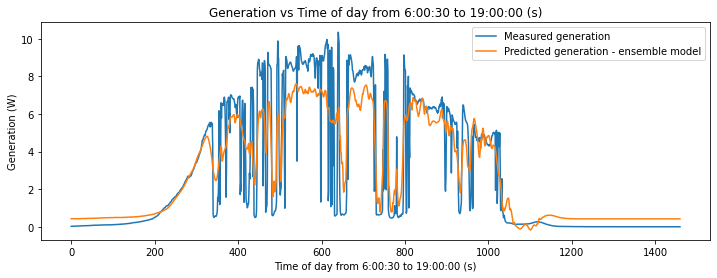

1.3602208108516667 0.92


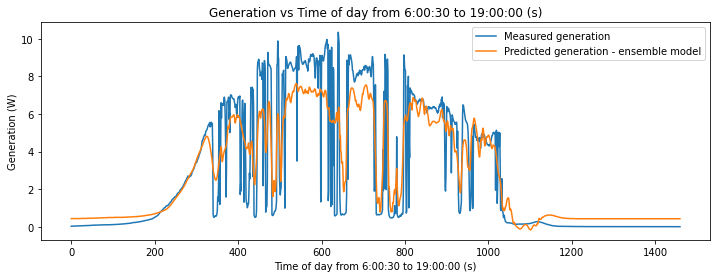

1.3653695979753402 0.93


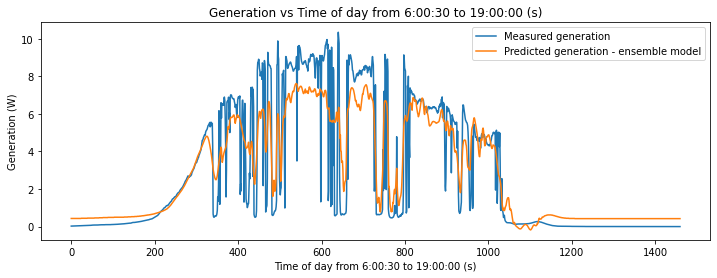

1.370559350326399 0.94


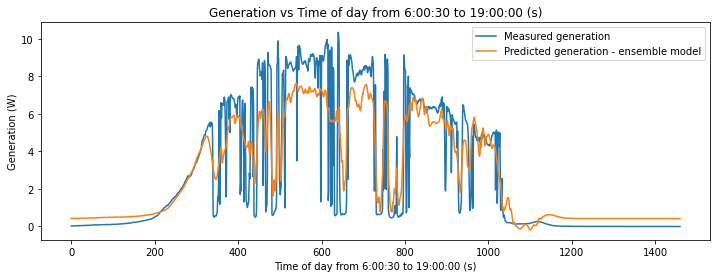

1.3757896043179392 0.95


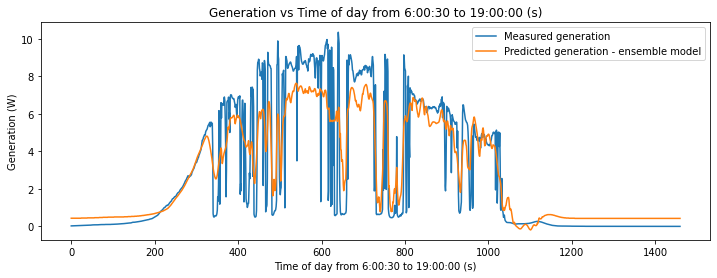

1.3810598997950498 0.96


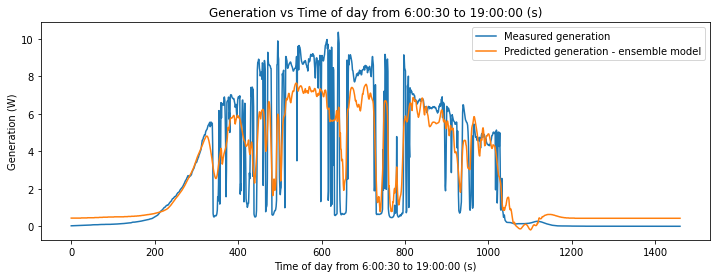

1.3863697801037569 0.97


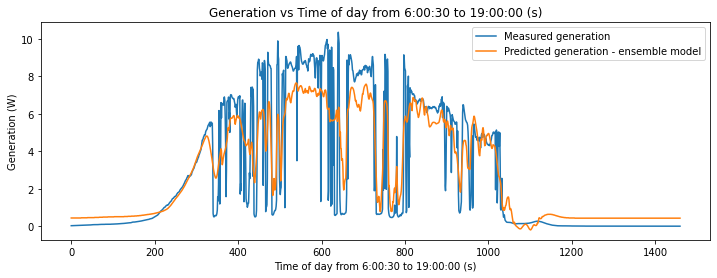

1.39171879215536 0.98


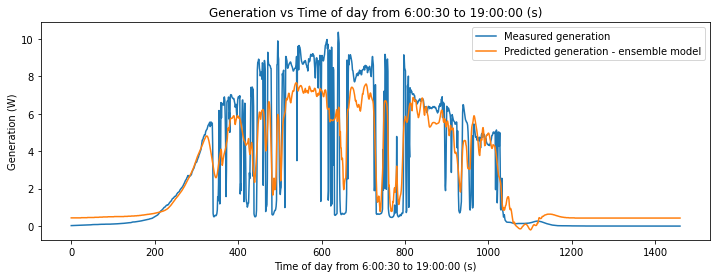

1.3971064864863385 0.99


In [ ]:
count = 0
for ensemble1 in ensemble:
  plt.figure(figsize=(12,4))
  #
  plt.plot( list(Expected1))
  plt.plot(ensemble1)
  # plt.plot(predn)
  # plt.plot(predn1)
  plt.title("Generation vs Time of day from 6:00:30 to 19:00:00 (s)")
  plt.ylabel("Generation (W)")
  plt.xlabel("Time of day from 6:00:30 to 19:00:00 (s)")
  plt.legend(('Measured generation','Predicted generation - ensemble model'))#, 'Predicted generation - sky imagery model', 'Predicted generation - satistical model'))
  plt.show()
  print(RMSE[count], weights_list[count])
  count +=1